In [1]:
## First import general packages for running python analysis:
import os, h5py, datetime,pytz,pickle, yaml, sys
import numpy as np
from matplotlib.pyplot import *
from matplotlib import pyplot as plt

## Then import the beamcals module, use forked repository (not original):
sys.path.insert(0, '../../classes/')
import corr_crs_mod_draft as corr
import drone_crs_mod_draft as drone
import concat_crs_mod_draft as concat
import plotting_utils_crs_mod_draft as pu
import fitting_utils_crs_mod_draft as fu
import geometry_utils as gu
import time_utils as tu
import site_utils as si
import reduce as rc
gbosite=si.Site('../../metadata/GBO_DNS_CHORD_BICO_config.npz')
# Define any channels, etc, and directories for this flight analysis

# Define any channels, etc, and directories for this flight analysis

#config_directory="  "
maindir = '/hirax/DNS_freespace/2026_07_GBO/'
dronedir = maindir+'processed_flight_records/'
cdir = maindir+'TONE_crs_files/'
gdir = maindir+'TONE_crs_files/gains/' 

# define which channels in the data files are useful
# 0-> 00  (local noise auto) ref?
# 1-> 01  (cross with bicolog) 
# 2 -> 02 (cross with first pol) P1 = NW
# 3 -> 03 (cross with second pol) P2 = NE
# 4 -> 11 (bicolog auto)
# 8 -> 22 (first pol auto)
# 12 -> 33 (second pol auto)

crmap = [0,1,2,3,4,8,12]
chnames = ['ref_auto','bico_cross','NW_cross','NE_cross','bico_auto','NW_auto','NE_auto']
copolchan = 3
# from crmap, which indices are autos, which indices are ref crosses
autos = [0,4,8,12]
crosses = [1,2,3]


from pathlib import Path
cdir_p = Path(cdir)
first_hdf5 = next(cdir_p.rglob("*.hdf5"))
f = h5py.File(first_hdf5, "r")
print("test file:", first_hdf5, f)
# define default 'good' frequency for plotting
f_ind = 3500 
freqs = f['index_map']['freq']
print("freq (MHz):", freqs[f_ind])

###################
#### FUNCTIONS ####
###################

def get_mag_phase(power0):
    """
    # return magnitude and phase in degrees of correlations
    """
    return np.absolute(power0), np.rad2deg(np.angle(power0))



test file: /hirax/DNS_freespace/2026_07_GBO/TONE_crs_files/drone_flight6_NEgrid_NWpol_32db_jul1_1250/8.hdf5 <HDF5 file "8.hdf5" (mode r)>
freq (MHz): 683.59375


In [2]:
# import numpy as np

# # Load the original configuration
# npz = np.load('../../metadata/GBO_DNS_config.npz', allow_pickle=True)
# config = {k: npz[k] for k in npz.files}

# # -------------------------------------------------------
# # Reorder channels
# # Old order:
# #   0 = Dish_5_X
# #   1 = Dish_5_Y
# #   2 = Dish_8_Y
# #   3 = Reference_channel
# #
# # New order:
# #   0 = Reference
# #   1 = BicoLOG
# #   2 = CHORD_NW
# #   3 = CHORD_NE
# # -------------------------------------------------------

# order = [3, 0, 1, 2]

# config["coords"] = config["coords"][order]
# config["pointings"] = config["pointings"][order]
# config["polarizations"] = config["polarizations"][order]

# # Rename channels
# config["keystrings"] = np.array([
#     "Reference",
#     "BicoLOG",
#     "CHORD_NW",
#     "CHORD_NE"
# ])

# # -------------------------------------------------------
# # Update coordinates
# # -------------------------------------------------------

# # Dish 5 coordinates (after reordering, these are rows 2 and 3)
# dish5_coords = config["coords"][2].copy()

# # 32 ft 8 in north = 9.9568 m
# north_offset_m = (32 + 8/12) * 0.3048

# # Reference stays NaN
# config["coords"][0] = np.array([np.nan, np.nan, np.nan])

# # BicoLOG = Dish 5 shifted north
# config["coords"][1] = dish5_coords.copy()
# config["coords"][1][1] += north_offset_m

# # CHORD_NW and CHORD_NE both use Dish 5 coordinates
# config["coords"][2] = dish5_coords.copy()
# config["coords"][3] = dish5_coords.copy()

# # -------------------------------------------------------
# # Save edited configuration
# # -------------------------------------------------------

# np.savez('../../metadata/GBO_DNS_CHORD_BICO_config.npz', **config)

# print("Saved new configuration to '../../metadata/GBO_DNS_CHORD_BICO_config.npz'")


# npz = np.load('../../metadata/GBO_DNS_CHORD_BICO_config.npz', allow_pickle=True)

# for key in ["keystrings", "coords"]:
#     print(f"\n--- {key} ---")
#     print(npz[key])

In [2]:
import numpy as np

# Replace with your file path
npz = np.load('../../metadata/GBO_DNS_CHORD_BICO_config.npz', allow_pickle=True)

print(npz.files)

for key in npz.files:
    print(f"\n--- {key} ---")
    print(npz[key])

['name', 'n_dishes', 'n_channels', 'chmap', 'keystrings', 'origin', 'coords', 'pointings', 'polarizations']

--- name ---
GBO_DNS_config

--- n_dishes ---
2

--- n_channels ---
4

--- chmap ---
[0 1 2 3]

--- keystrings ---
['Reference' 'BicoLOG' 'CHORD_NW' 'CHORD_NE']

--- origin ---
[ 38.42928 -79.84499 810.     ]

--- coords ---
[[         nan          nan          nan]
 [-16.47562334  21.89848478   0.        ]
 [-16.47562334  11.94168478   0.        ]
 [-16.47562334  11.94168478   0.        ]]

--- pointings ---
[[0 0 1]
 [0 0 1]
 [0 0 1]
 [0 0 1]]

--- polarizations ---
[[0 0 1]
 [0 0 1]
 [0 0 1]
 [0 0 1]]


In [2]:
#NWgrid + NEdrone BEST flight: 42dB atten, fixed LNAs
datadir = cdir + 'drone_flight7_NWgrid_NEpol_42db_jul2_1900/'
gaindir = gdir + '20260702-185855_gbo_gains_chord_path_drone_gridNWNE_Jul2_1900.npy'



#5 star spinning hover over TONE dish 8
flyfile='Jul-2nd-2026-07-08PM-Flight-Airdata.csv'

In [3]:
dronedata=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG=flyfile,site_class=gbosite,tlb=0,tub=-1)

Initializing drone data via Airdata.csv routine: Jul-2nd-2026-07-08PM-Flight-Airdata.csv
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.


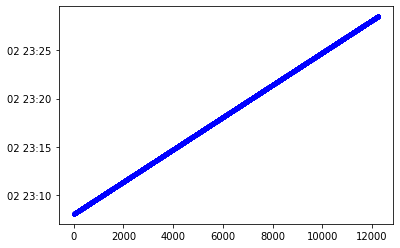

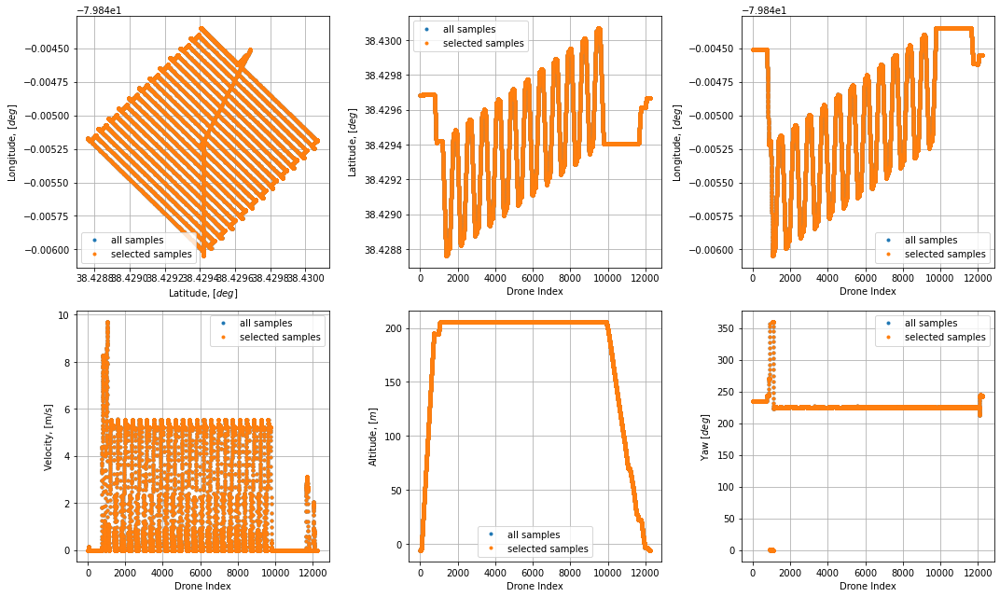

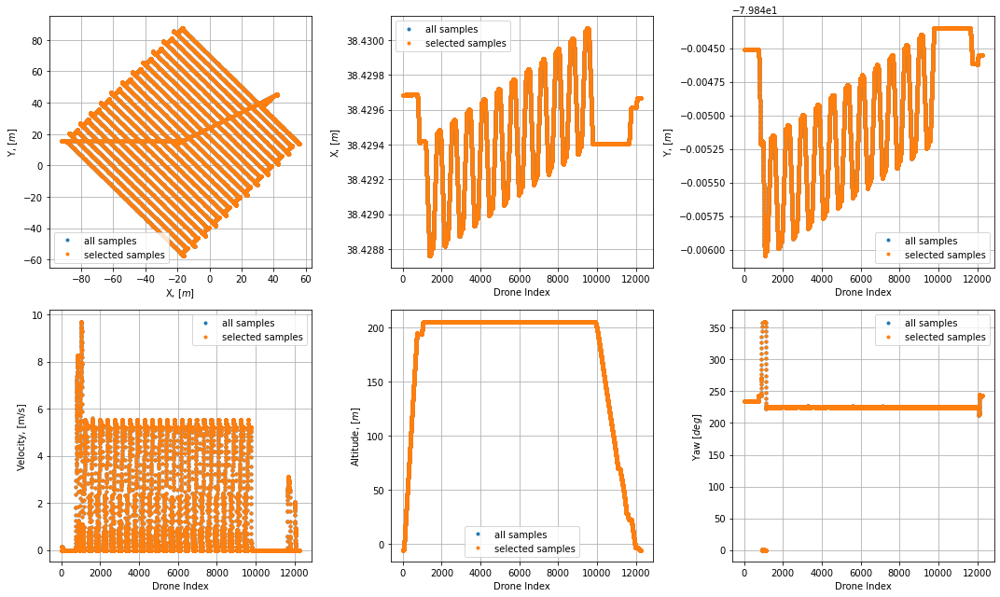

In [4]:
# Plot some drone data to get familiar with the coordinates in the drone class

# Look at time stamps

plt.plot(dronedata.t_arr_datetime,'b.',label='drone')
plt.show()


## Plot lat/long
fig1,[[ax1,ax2,ax3],[ax4,ax5,ax6]]=subplots(nrows=2,ncols=3,figsize=(15,9))
## Plot p0 coordinate origin:
ax1.plot(dronedata.origin[0],dronedata.origin[1],'ro')
ax2.axhline(dronedata.origin[0],c='b')
ax3.axhline(dronedata.origin[1],c='b')
## Title each coordinate subplot:        
ax1.set_title('Lat vs Lon')
ax2.set_title('Lat vs Time')
ax3.set_title('Lon vs Time')
ax4.set_title('Velocity vs Time')
ax5.set_title('Altitude vs Time')
ax6.set_title('Yaw vs Time')
## Specify arrays/vectors to plot in 1,3,4 coordinate subplot
xqtys=[dronedata.latitude,dronedata.t_index,dronedata.t_index,dronedata.t_index,dronedata.t_index,dronedata.t_index]
yqtys=[dronedata.longitude,dronedata.latitude,dronedata.longitude,dronedata.velocity,dronedata.altitude,dronedata.yaw]
xtags=['Latitude, [$deg$]','Drone Index','Drone Index','Drone Index','Drone Index','Drone Index']
ytags=['Longitude, [$deg$]','Latitude, [$deg$]','Longitude, [$deg$]','Velocity, [m/s]','Altitude, [$m$]','Yaw [$deg$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.plot(np.nanmin(xqtys[i]),np.nanmin(yqtys[i]))
    ax.plot(np.nanmax(xqtys[i]),np.nanmax(yqtys[i]))
    autoscalelims=ax.axis()
    ax.clear()
    ax.plot(xqtys[i],yqtys[i],'.',label='all samples')
    ax.plot(xqtys[i],yqtys[i],'.',label='selected samples')
    ax.set_xlabel(xtags[i])
    ax.set_ylabel(ytags[i])
    ax.grid()
    ax.legend()
    ax.set_xlim(autoscalelims[0],autoscalelims[1])
    ax.set_ylim(autoscalelims[2],autoscalelims[3])
tight_layout()
plt.show()

## Plot local X/Y coords
fig1,[[ax1,ax2,ax3],[ax4,ax5,ax6]]=subplots(nrows=2,ncols=3,figsize=(15,9))
## Plot p0 coordinate origin:
ax1.set_title('X vs Y')
ax2.set_title('X vs Time')
ax3.set_title('Y vs Time')
ax4.set_title('Velocity vs Time')
ax5.set_title('Altitude vs Time')
ax6.set_title('Yaw vs Time')
## Specify arrays/vectors to plot in 1,3,4 coordinate subplot
xqtys=[dronedata.coords_xyz_LC[:,0],dronedata.t_index,dronedata.t_index,dronedata.t_index,dronedata.t_index,dronedata.t_index]
yqtys=[dronedata.coords_xyz_LC[:,1],dronedata.latitude,dronedata.longitude,dronedata.velocity,dronedata.altitude,dronedata.yaw]
xtags=['X, [$m$]','Drone Index','Drone Index','Drone Index','Drone Index','Drone Index']
ytags=['Y, [$m$]','X, [$m$]','Y, [$m$]','Velocity, [m/s]','Altitude, [$m$]','Yaw [$deg$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6]):
    ax.plot(np.nanmin(xqtys[i]),np.nanmin(yqtys[i]))
    ax.plot(np.nanmax(xqtys[i]),np.nanmax(yqtys[i]))
    autoscalelims=ax.axis()
    ax.clear()
    ax.plot(xqtys[i],yqtys[i],'.',label='all samples')
    ax.plot(xqtys[i],yqtys[i],'.',label='selected samples')
    ax.set_xlabel(xtags[i])
    ax.set_ylabel(ytags[i])
    ax.grid()
    ax.legend()
    ax.set_xlim(autoscalelims[0],autoscalelims[1])
    ax.set_ylim(autoscalelims[2],autoscalelims[3])
tight_layout()
plt.show()    

(1000, 8192, 36)
(1000,)
(1000,)
100.70833945274353
2026-07-02 23:12:53.115775
2026-07-02 23:14:33.824114
1783033973.1157746


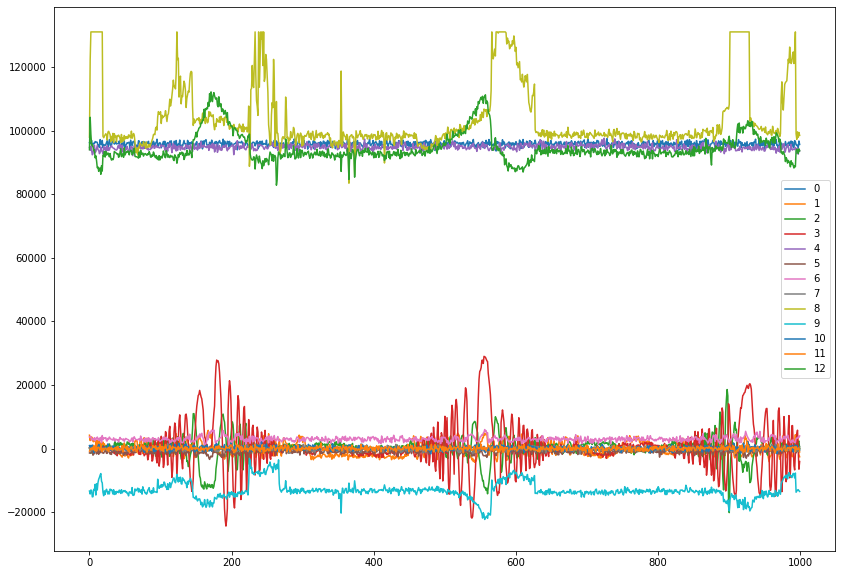

In [6]:
 # Which channels are interesting?
    
fd=h5py.File(datadir+'7.hdf5', 'r')

print(fd['vis'].shape) # time, freq, product
print(fd['counts'].shape)
print(fd['index_map']['time'].shape)

plt.figure(figsize=(14,10))
for i in np.arange(0,13):
    plt.plot(fd['vis'][:,f_ind,i].real,label=str(i)) # both real and imag are informative
plt.legend()
plt.plot()


t0 = fd['index_map']['time'][0]
t_end = fd['index_map']['time'][-1]

diff = t_end - t0
print(diff)

print(datetime.datetime.utcfromtimestamp(t0))
print(datetime.datetime.utcfromtimestamp(t_end))

print(fd['index_map']['time'][0])

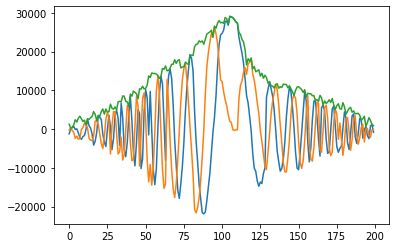

In [6]:
plt.plot(fd['vis'][450:650,3500,3].real)
plt.plot(fd['vis'][450:650,3500,3].imag)
plt.plot(np.abs(fd['vis'][450:650,3500,3]))

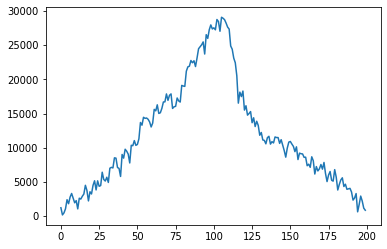

In [7]:
plt.plot(np.abs(fd['vis'][450:650,3500,3]))

-731.0


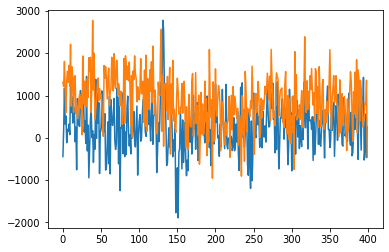

In [8]:
fd=h5py.File(datadir+'0.hdf5', 'r')
t0 = fd['index_map']['time'][0]

plt.plot(fd['vis'][:400,3500,1].real)
plt.plot(fd['vis'][:400,3500,2].imag)

print(np.median(fd['vis'][:400,3500,2].real) - np.median(fd['vis'][:400,3500,2].imag))

In [21]:
fd.keys()
fd['index_map'].keys()

<KeysViewHDF5 ['freq', 'prod', 'time']>

In [22]:
print(fd['index_map']['time'][:100])

[1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.783033

In [23]:
print(np.diff(fd['index_map']['time'][:100]))
print(np.mean(np.diff(fd['index_map']['time'][:100])))
print(np.std(np.diff(fd['index_map']['time'][:100])))

[0.25799656 0.09480333 0.08588672 0.09455633 0.08870006 0.09102559
 0.09351778 0.09345055 0.08955717 0.10969472 0.12031794 0.10486722
 0.10244966 0.08362436 0.0829432  0.08249068 0.08292437 0.08643222
 0.08844423 0.088696   0.09192228 0.08912754 0.09482098 0.09316897
 0.0838356  0.09606457 0.09659433 0.09472704 0.10143042 0.1896069
 0.08990049 0.08943295 0.16178489 0.08568621 0.08757162 0.09846735
 0.09675121 0.22061348 0.09401464 0.09369493 0.09426427 0.0977602
 0.09159636 0.08349276 0.0798831  0.08065629 0.08229733 0.08020806
 0.07991171 0.08228374 0.08082557 0.08119988 0.08176708 0.0804317
 0.07944226 0.08199644 0.07988524 0.08042765 0.08137894 0.08009863
 0.08037043 0.08257389 0.08123541 0.08025455 0.15795946 0.08278513
 0.08074737 0.08387184 0.08023715 0.08084226 0.08231497 0.08108187
 0.07960677 0.08359218 0.08006477 0.08039689 0.08226562 0.08108783
 0.08067322 0.08281708 0.08012533 0.08103275 0.08216977 0.08158851
 0.08120751 0.08238316 0.08088827 0.08078218 0.08213043 0.0806975

In [24]:
print(fd['counts'])

<HDF5 dataset "counts": shape (1000,), type "<u4">


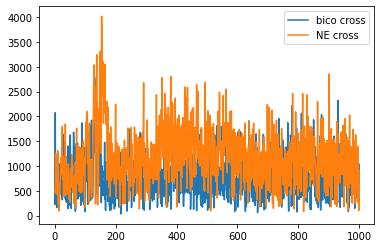

In [25]:
plt.plot(np.abs(fd['vis'][:,f_ind,1]),label='bico cross')
plt.plot(np.abs(fd['vis'][:,f_ind,3]),label='NE cross')
plt.legend()

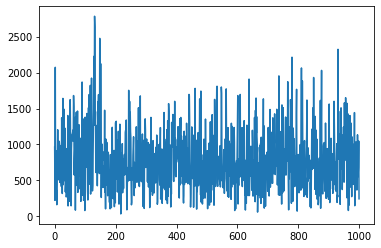

In [26]:
plt.plot(np.abs(fd['vis'][:,f_ind,1]),label='bico cross')

In [27]:
print(fd['index_map']['time'][:10])
print(datetime.datetime.fromtimestamp(fd['index_map']['time'][0], pytz.utc))

[1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09 1.78303331e+09 1.78303331e+09
 1.78303331e+09 1.78303331e+09]
2026-07-02 23:01:45.408217+00:00


-519.59


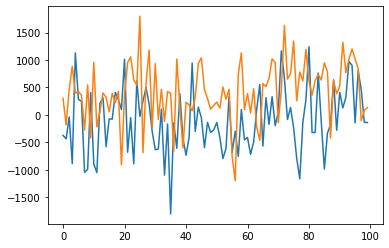

In [29]:
plt.plot(fd['vis'][:100,3500,3].real)
plt.plot(fd['vis'][:100,3500,3].imag)

print(np.mean(fd['vis'][:100,3500,3].real - fd['vis'][:100,3500,3].imag))

In [30]:
np.shape(fd['vis'])

(1000, 8192, 36)

In [4]:
corrdata=corr.Corr_Data(Data_Directory=datadir,
                        Gain_Directory=gaindir,site_class=gbosite,crs=True,fbounds=[0,8192],
                        Load_Gains=True,Apply_Gains=True,
                        offset_time_samples=100,Data_File_Index=[0,1]) 

# # Save the entire object
# with open("/hirax/DNS_freespace/2026_07_GBO/analysis_outputs/corrdata_NWgNEp_GBO26.pkl", "wb") as f:
#     pickle.dump(corrdata,f,protocol=pickle.HIGHEST_PROTOCOL)

Initializing Correlator Class using:
  --> /hirax/DNS_freespace/2026_07_GBO/TONE_crs_files/drone_flight7_NWgrid_NEpol_42db_jul2_1900/
Assigning array values by reading in data files:
  --> Loading File 1/1
  --> Finished. Reshaping arrays.


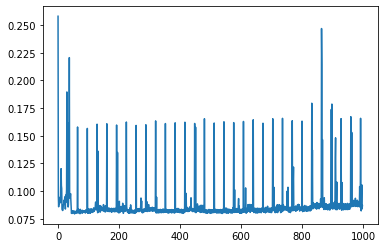

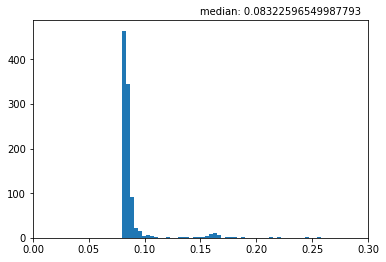

In [5]:
plt.plot(np.diff(corrdata.t))
plt.show()

plt.hist(np.diff(corrdata.t),bins=50)
plt.xlim(0,0.3)
plt.text(.15,500,"median: "+str(np.median(np.diff(corrdata.t))))
plt.show()

In [5]:
with open("/hirax/DNS_freespace/2026_07_GBO/analysis_outputs/corrdata_NWgNEp_GBO26.pkl", "rb") as f:
    corrdata = pickle.load(f)

print("Loaded synchronized corr object.")

Loaded synchronized corr object.


In [8]:
print(corrdata.V_cross.shape)

(14000, 8192, 7)


45.91


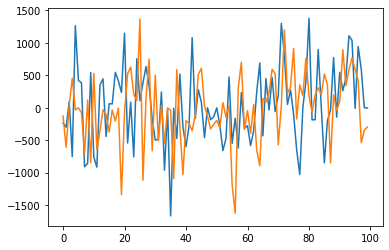

In [9]:
plt.plot(corrdata.V_cross[:100,3500,3].real)
plt.plot(corrdata.V_cross[:100,3500,3].imag)

print(np.mean(corrdata.V_cross[:100,3500,3].real - corrdata.V_cross[:100,3500,3].imag))

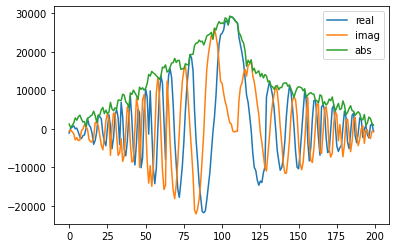

In [33]:
plt.plot(corrdata.V_cross[7000+450:7000+650,3500,3].real,label='real')
plt.plot(corrdata.V_cross[7000+450:7000+650,3500,3].imag,label='imag')
plt.plot(np.abs(corrdata.V_cross[7000+450:7000+650,3500,3]),label='abs')
plt.legend()

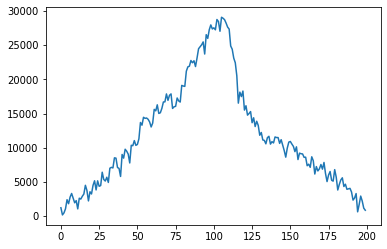

In [35]:
plt.plot(np.abs(fd['vis'][450:650,3500,3]))

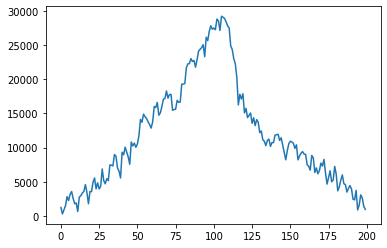

In [36]:
plt.plot(np.abs(corrdata.V_cross[7000+450:7000+650,3500,3]),label='abs')

In [17]:
corrdata.crossmap

[0, 1, 2, 3, 4, 8, 12]

In [18]:
np.shape(corrdata.V_cross)

(14000, 8192, 7)

(14000, 8192, 7)


(array([20636.96180556, 20636.96527778, 20636.96875   , 20636.97222222,
        20636.97569444]),
 [Text(20636.961805555555, 0, '23:05:00'),
  Text(20636.965277777777, 0, '23:10:00'),
  Text(20636.96875, 0, '23:15:00'),
  Text(20636.972222222223, 0, '23:20:00'),
  Text(20636.975694444445, 0, '23:25:00')])

<Figure size 2016x1800 with 0 Axes>

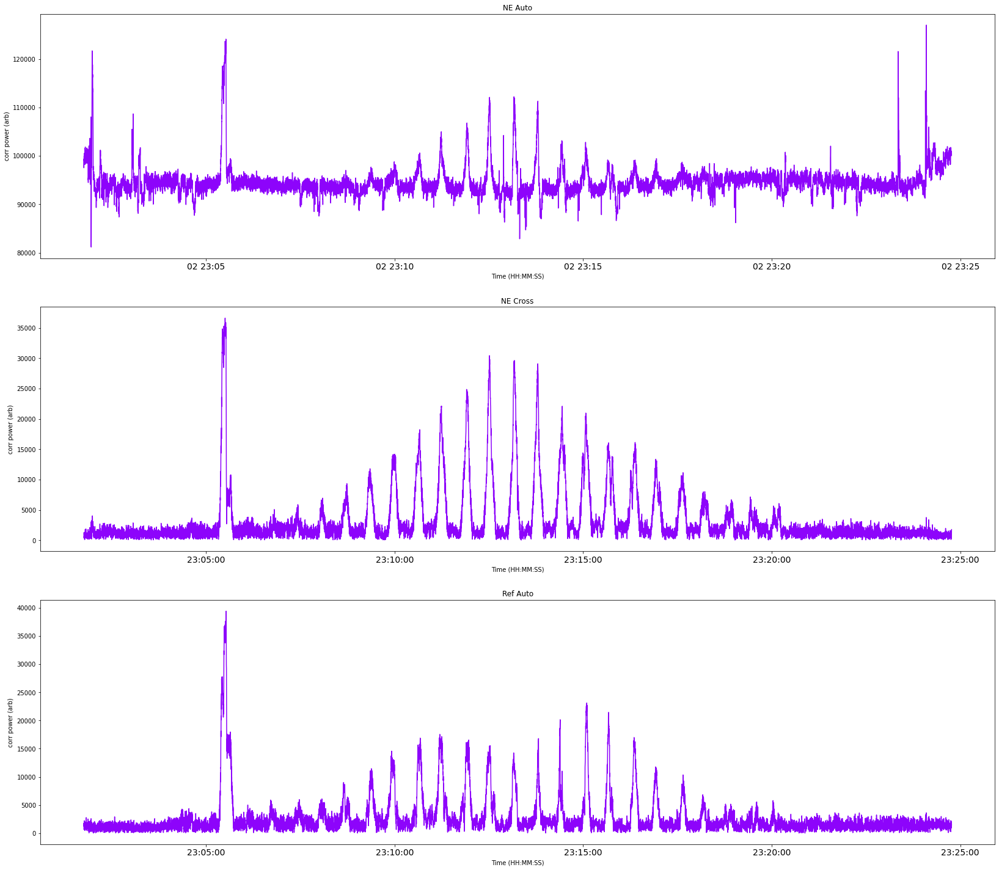

In [7]:
#Displaying the corr auto and cross power plots like we usually do

from matplotlib import dates as mdates

def get_mag_phase(power0):
    """
    # return magnitude and phase in degrees of correlations
    """
    return np.absolute(power0), np.rad2deg(np.angle(power0))

pow_mag, pow_phase = get_mag_phase(corrdata.V_cross)

print(pow_mag.shape)

plt.figure(figsize=[28,25])

colorsarr=cm.gnuplot2(np.linspace(0,1,8192))
plt.figure(figsize=[28,25])
fbin=f_ind
k=50
tmin,tmax=[0,-1]
# Convert timestamps just once
times = corrdata.t_arr_datetime
times = times[tmin:tmax]  # apply slicing like the data

# Plot
plt.subplot(3,1,1)
plt.plot(times, pow_mag[tmin:tmax, fbin, 6], c=colorsarr[fbin])
plt.title(f"NE Auto")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.xticks(fontsize=14)

plt.subplot(3,1,2)
plt.plot(times, pow_mag[tmin:tmax, fbin, 3], c=colorsarr[fbin])
plt.title(f"NE Cross")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=20))
plt.xticks(fontsize=14)

plt.subplot(3,1,3)
plt.plot(times, pow_mag[tmin:tmax, fbin, 2], c=colorsarr[fbin])
plt.title(f"Ref Auto")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=20))
plt.xticks(fontsize=14)



(14000, 8192, 7)


(array([20636.96666667, 20636.96678241, 20636.96689815, 20636.96701389,
        20636.96712963, 20636.96724537, 20636.96736111, 20636.96747685,
        20636.96759259, 20636.96770833, 20636.96782407]),
 [Text(20636.966666666667, 0, '23:12:00'),
  Text(20636.966782407406, 0, '23:12:10'),
  Text(20636.966898148148, 0, '23:12:20'),
  Text(20636.96701388889, 0, '23:12:30'),
  Text(20636.96712962963, 0, '23:12:40'),
  Text(20636.96724537037, 0, '23:12:50'),
  Text(20636.96736111111, 0, '23:13:00'),
  Text(20636.967476851853, 0, '23:13:10'),
  Text(20636.96759259259, 0, '23:13:20'),
  Text(20636.967708333334, 0, '23:13:30'),
  Text(20636.967824074072, 0, '23:13:40')])

<Figure size 2016x1800 with 0 Axes>

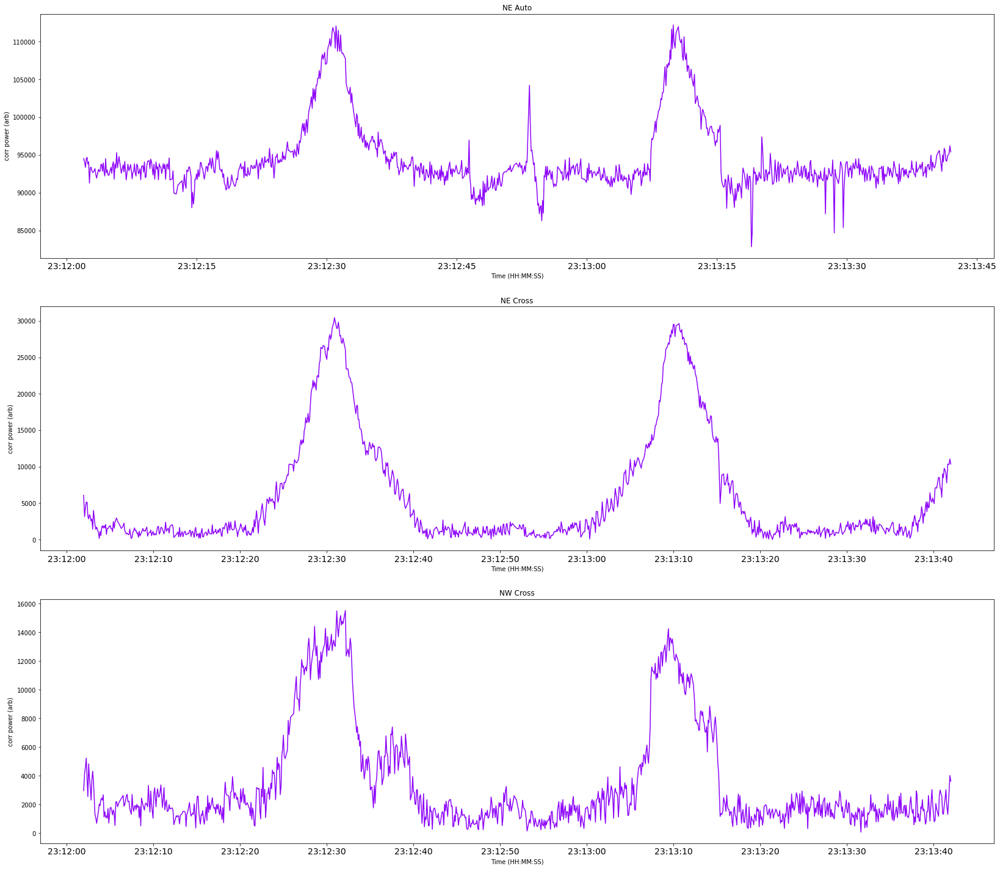

In [12]:
#Displaying the corr auto and cross power plots like we usually do

from matplotlib import dates as mdates

def get_mag_phase(power0):
    """
    # return magnitude and phase in degrees of correlations
    """
    return np.absolute(power0), np.rad2deg(np.angle(power0))

pow_mag, pow_phase = get_mag_phase(corrdata.V_cross)

print(pow_mag.shape)

plt.figure(figsize=[28,25])

colorsarr=cm.gnuplot2(np.linspace(0,1,8192))
plt.figure(figsize=[28,25])
fbin=f_ind
k=50
tmin,tmax=[6500,7500]
# Convert timestamps just once
times = corrdata.t_arr_datetime
times = times[tmin:tmax]  # apply slicing like the data

# Plot
plt.subplot(3,1,1)
plt.plot(times, pow_mag[tmin:tmax, fbin, 6], c=colorsarr[fbin])
plt.title(f"NE Auto")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.xticks(fontsize=14)

plt.subplot(3,1,2)
plt.plot(times, pow_mag[tmin:tmax, fbin, 3], c=colorsarr[fbin])
plt.title(f"NE Cross")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=20))
plt.xticks(fontsize=14)

plt.subplot(3,1,3)
plt.plot(times, pow_mag[tmin:tmax, fbin, 2], c=colorsarr[fbin])
plt.title(f"NW Cross")
plt.xlabel("Time (HH:MM:SS)")
plt.ylabel("corr power (arb)")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator(maxticks=20))
plt.xticks(fontsize=14)



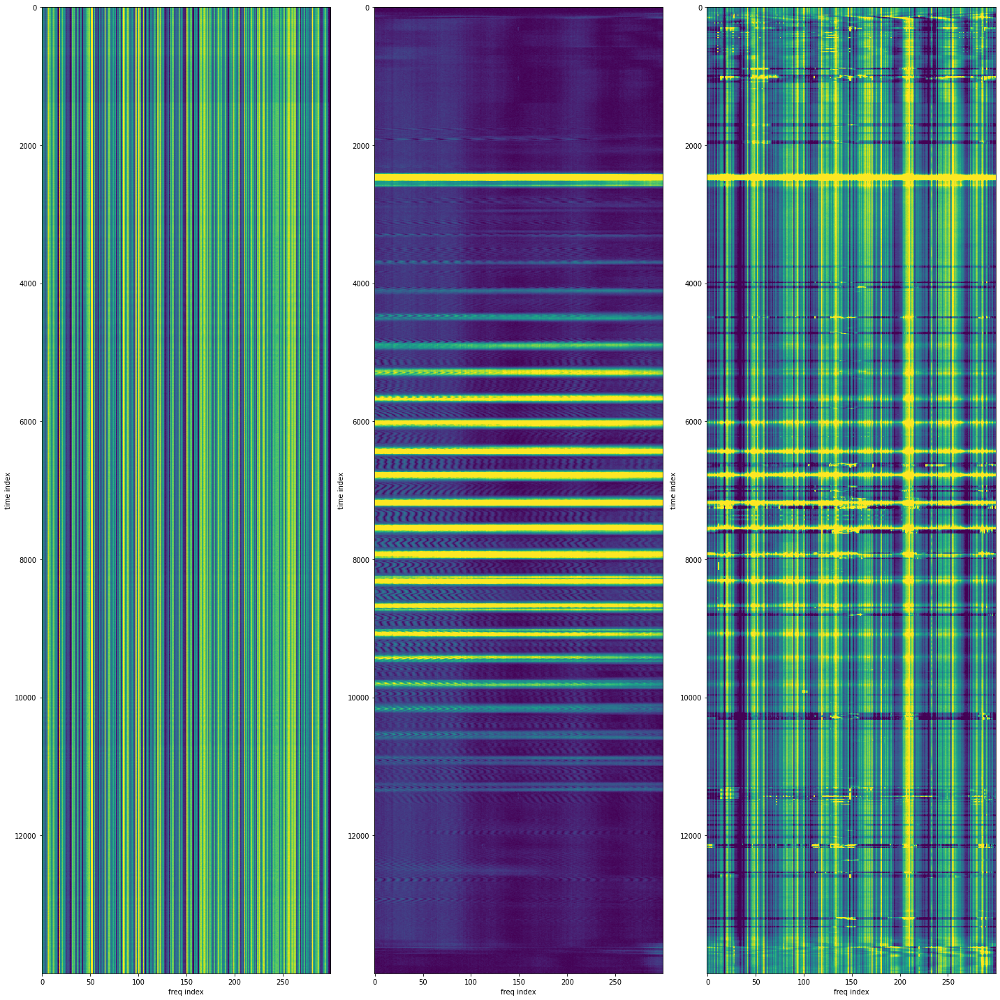

In [34]:
import math

def plot_waterfall_corr_data(data, corr_indices):
    plt.figure(figsize=(20, 20))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for i,auto in enumerate(corr_indices):
        plt.subplot(dim1, dim2, i + 1)
        wfall = data[:, :, auto] # auto -> corr index 
        plt.imshow(wfall, vmin = np.nanpercentile(wfall,5), vmax =np.nanpercentile(wfall,95), aspect='auto')
        plt.xlabel("freq index")
        plt.ylabel("time index")
        #plt.title(f"corr {corr_data.prod[auto]}")
    plt.tight_layout()


plot_waterfall_corr_data(pow_mag[:,3300:3600,:],[0,3,6])

In [6]:
corrdata.freq[3500]

683.59375

In [68]:
concatdata=concat.CONCAT(CORRDATCLASS=corrdata,DRONEDATCLASS=dronedata,\
                             load_yaml=False,traceback=False,save_traceback=False,t_drone_offset=0)

Created drone_pitch_interp
Filled drone_pitch_interp


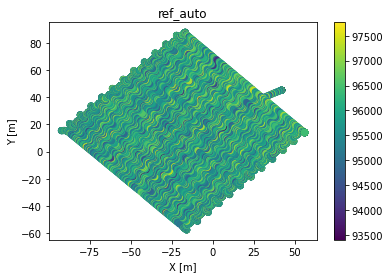

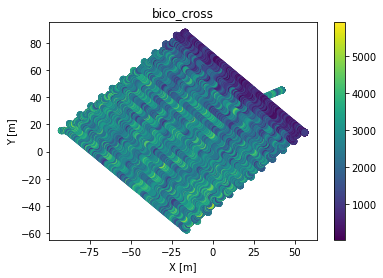

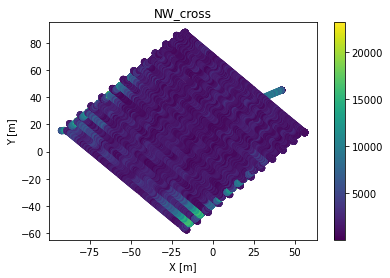

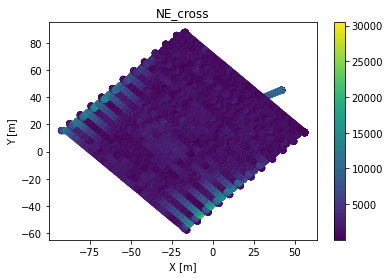

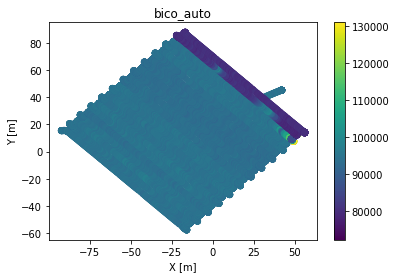

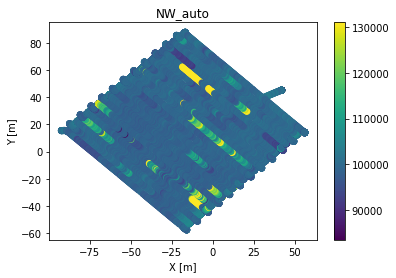

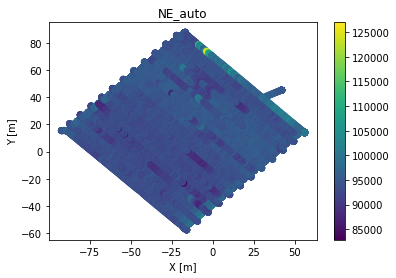

In [69]:
for j in np.arange(0,len(crmap)):
    plt.scatter(concatdata.drone_xyz_LC_interp[:,0],concatdata.drone_xyz_LC_interp[:,1],c=np.abs(concatdata.V_cross[:,f_ind,j]))
    plt.colorbar()
    plt.xlabel('X [m]')
    plt.ylabel('Y [m]')
    plt.title(chnames[j])
    plt.show()

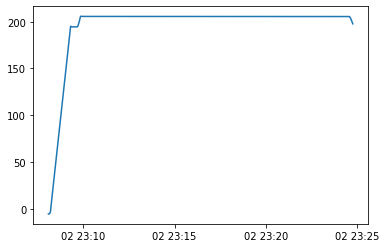

In [12]:
plt.plot(concatdata.t_arr_datetime,concatdata.drone_xyz_LC_interp[:,2],label='drone')

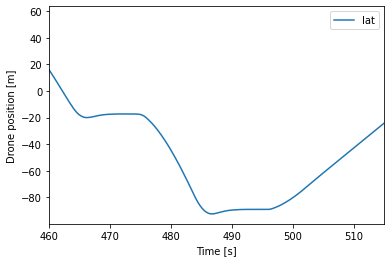

In [13]:
t_seconds = np.array([
    (t - concatdata.t_arr_datetime[0]).total_seconds()
    for t in concatdata.t_arr_datetime
])

plt.plot(t_seconds, concatdata.drone_xyz_LC_interp[:,0], label='lat')
plt.xlabel('Time [s]')
plt.ylabel('Drone position [m]')
plt.axvline(455)
plt.xlim(460,515)
plt.legend()
plt.show()

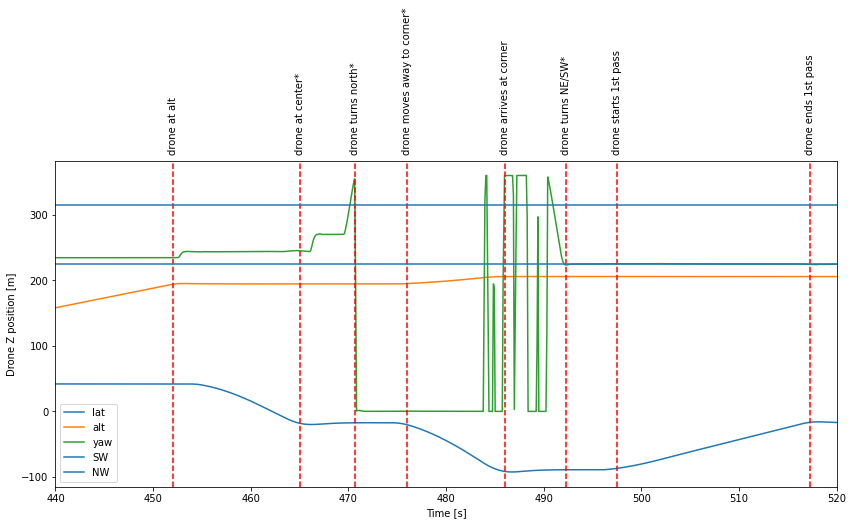

In [14]:
t_seconds = np.array([
    (t - concatdata.t_arr_datetime[0]).total_seconds()
    for t in concatdata.t_arr_datetime
])

plt.figure(figsize=(14,6))
plt.plot(t_seconds, concatdata.drone_xyz_LC_interp[:,0], label='lat')
plt.plot(t_seconds, concatdata.drone_xyz_LC_interp[:,2], label='alt')
plt.plot(t_seconds, concatdata.drone_yaw_interp[:], label='yaw')
plt.xlabel('Time [s]')
plt.ylabel('Drone Z position [m]')

plt.axvline(452, color='red', linestyle='--')
plt.text(
    452,
    1.02,                     # just above the axes
    'drone at alt',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)


plt.axvline(465, color='red', linestyle='--')
plt.text(
    465,
    1.02,                     # just above the axes
    'drone at center*',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)


plt.axvline(470.7, color='red', linestyle='--')
plt.text(
    470.7,
    1.02,                     # just above the axes
    'drone turns north*',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.axvline(476, color='red', linestyle='--')
plt.text(
    476,
    1.02,                     # just above the axes
    'drone moves away to corner*',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.axvline(486, color='red', linestyle='--')
plt.text(
    486,
    1.02,                     # just above the axes
    'drone arrives at corner',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)


plt.axvline(492.25, color='red', linestyle='--')
plt.text(
    492.25,
    1.02,                     # just above the axes
    'drone turns NE/SW*',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)


plt.axvline(497.5, color='red', linestyle='--')
plt.text(
    497.5,
    1.02,                     # just above the axes
    'drone starts 1st pass',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.axvline(517.25, color='red', linestyle='--')
plt.text(
    517.25,
    1.02,                     # just above the axes
    'drone ends 1st pass',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.axhline(225, label='SW')
plt.axhline(315, label='NW')
plt.xlim(440,520)
plt.legend()
plt.show()

(780.0, 870.0)

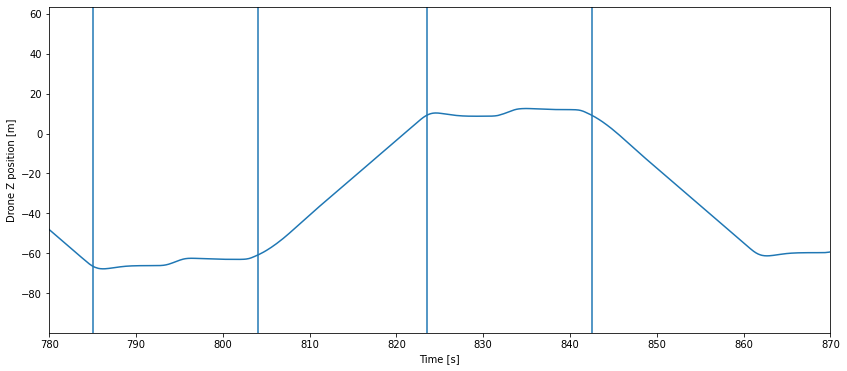

In [39]:
t_seconds = np.array([
    (t - concatdata.t_arr_datetime[0]).total_seconds()
    for t in concatdata.t_arr_datetime
])

plt.figure(figsize=(14,6))
plt.plot(t_seconds, concatdata.drone_xyz_LC_interp[:,0], label='lat')
plt.xlabel('Time [s]')
plt.ylabel('Drone Z position [m]')

plt.axvline(785)
plt.axvline(785+19)

plt.axvline(823.5)
plt.axvline(823.5+19)
plt.xlim(780,870)

In [40]:
(785+9.5) - (823+9.5)

-38.0

In [27]:
476-470.4

5.600000000000023

In [28]:
470.6-465

5.600000000000023

In [29]:
232.25-5.4

226.85

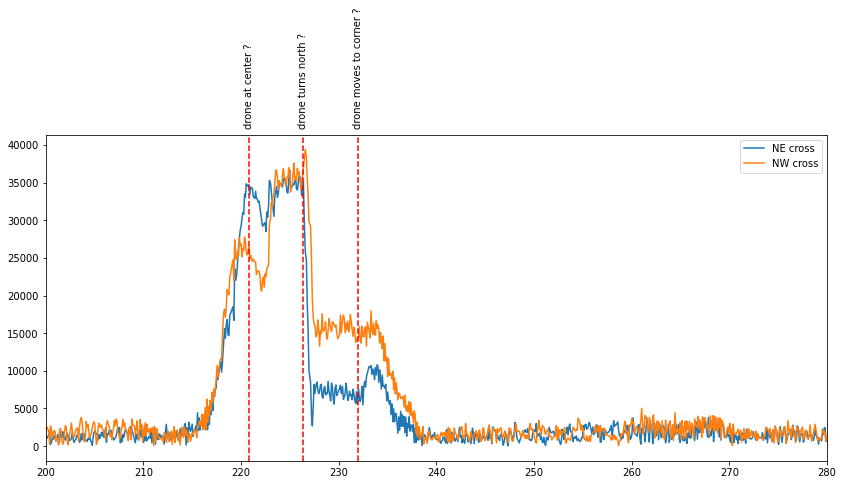

In [30]:
plt.figure(figsize=(14,6))
plt.plot(t_seconds,abs(concatdata.V_cross[:,f_ind,3]),label='NE cross')
plt.plot(t_seconds,abs(concatdata.V_cross[:,f_ind,2]),label='NW cross')
plt.xlim(200,280)

plt.axvline(226.4-5.6, color='red', linestyle='--')
plt.text(
    226.4-5.6,
    1.02,                     # just above the axes
    'drone at center ?',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)


plt.axvline(226.4, color='red', linestyle='--')
plt.text(
    226.4,
    1.02,                     # just above the axes
    'drone turns north ?',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.axvline(226.4+5.6, color='red', linestyle='--')
plt.text(
    226.4+5.6,
    1.02,                     # just above the axes
    'drone moves to corner ?',
    rotation=90,
    ha='center',
    va='bottom',
    transform=plt.gca().get_xaxis_transform()
)

plt.legend()

In [12]:
226.4-5.6

220.8

In [23]:
5.6*2

11.2

In [13]:
220.8-218

2.8000000000000114

In [31]:
685-645 #665 = center index

40

In [32]:
870-665

205

In [33]:
205/60

3.4166666666666665

In [34]:
226.4 - 470.7

-244.29999999999998

In [35]:
# # Shift the drone timestamps by ~4 minutes
# t_offset = -244.3 # seconds

# dronedata.t_arr_datetime = np.array([
#     t + datetime.timedelta(seconds=t_offset)
#     for t in dronedata.t_arr_datetime
# ], dtype=object)

In [19]:
concatdata_mtc=concat.CONCAT(CORRDATCLASS=corrdata,DRONEDATCLASS=dronedata,\
                             load_yaml=False,traceback=False,save_traceback=False,t_drone_offset=-243.7)

#243.7
#for sure push down: -243.9
#for sure push up: -243.5

Created drone_pitch_interp
Filled drone_pitch_interp


In [36]:
print(np.median([-243.5,-243.9]))

print(np.diff([-243.5,-243.9])/2)

#so if I choose -243.7 as the manual offset, I know the "real answer" is within +/-0.2 seconds
#fine search: -0.2,0.2,0.001

-243.7
[-0.2]


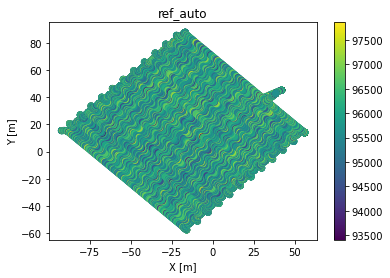

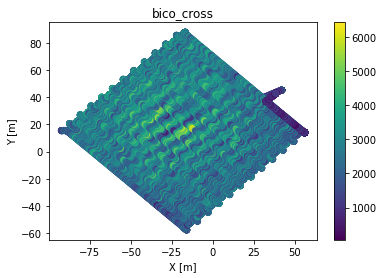

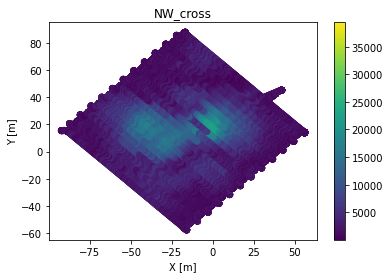

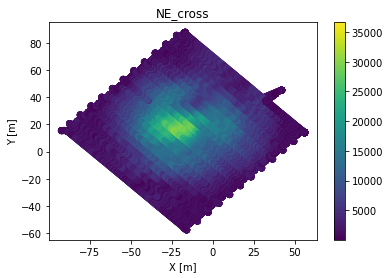

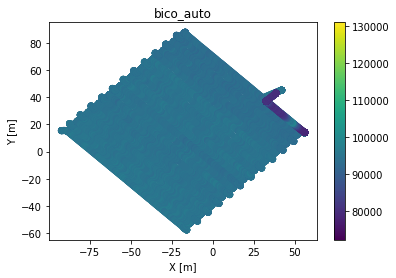

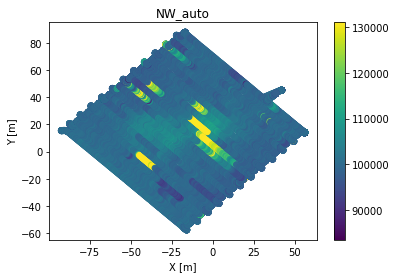

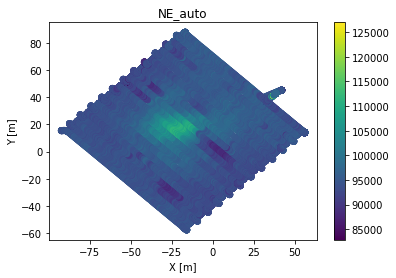

In [18]:
for j in np.arange(0,len(crmap)):
    plt.scatter(concatdata_mtc.drone_xyz_LC_interp[:,0],concatdata_mtc.drone_xyz_LC_interp[:,1],c=np.abs(concatdata_mtc.V_cross[:,f_ind,j]))
    plt.colorbar()
    plt.xlabel('X [m]')
    plt.ylabel('Y [m]')
    plt.title(chnames[j])
    plt.show()

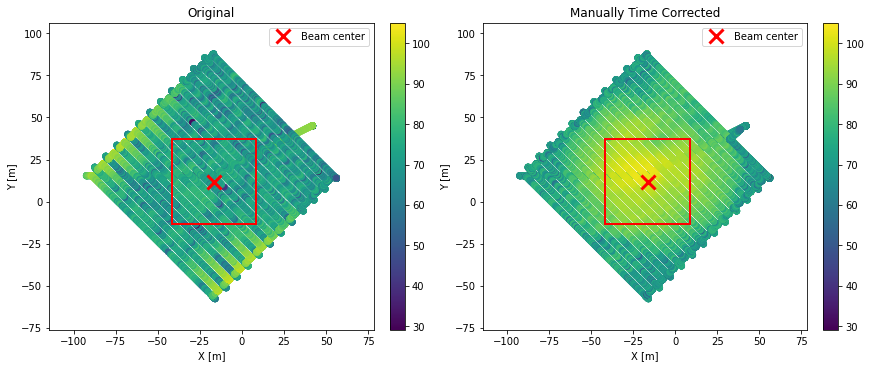

In [70]:
from matplotlib.patches import Rectangle

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

chan = 3
box_size = 50  # meters (adjust as desired)

# Compute values once
c1 = 10*np.log(np.abs(concatdata.V_cross[:, f_ind, chan]))
c2 = 10*np.log(np.abs(concatdata_mtc.V_cross[:, f_ind, chan]))

# Use a common color scale
vmin = min(np.nanmin(c1), np.nanmin(c2))
vmax = max(np.nanmax(c1), np.nanmax(c2))

# Beam center from site class
x0 = concatdata.dish_coords[chan, 0]
y0 = concatdata.dish_coords[chan, 1]

# Left plot
sc1 = ax1.scatter(
    concatdata.drone_xyz_LC_interp[:,0],
    concatdata.drone_xyz_LC_interp[:,1],
    c=c1,
    vmin=vmin,
    vmax=vmax
)

ax1.plot(x0, y0, 'rx', markersize=14, markeredgewidth=3, label='Beam center')
ax1.add_patch(Rectangle(
    (x0 - box_size/2, y0 - box_size/2),
    box_size,
    box_size,
    fill=False,
    edgecolor='red',
    linewidth=2
))

ax1.set_title("Original")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.axis('equal')
ax1.legend()
fig.colorbar(sc1, ax=ax1)

# Right plot
sc2 = ax2.scatter(
    concatdata_mtc.drone_xyz_LC_interp[:,0],
    concatdata_mtc.drone_xyz_LC_interp[:,1],
    c=c2,
    vmin=vmin,
    vmax=vmax
)

ax2.plot(x0, y0, 'rx', markersize=14, markeredgewidth=3, label='Beam center')
ax2.add_patch(Rectangle(
    (x0 - box_size/2, y0 - box_size/2),
    box_size,
    box_size,
    fill=False,
    edgecolor='red',
    linewidth=2
))

ax2.set_title("Manually Time Corrected")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
ax2.axis('equal')
ax2.legend()
fig.colorbar(sc2, ax=ax2)

plt.show()

In [53]:
concatdata.Synchronization_Function(
    inputcorr=corrdata,
    inputdrone=dronedata,
    coarse_params=[-243.8-15, -243.8+15, 1.0],
    fine_params= [-0.5, 0.5, 0.0005],
    FMB_coordbounds=[50.0, 50.0, 180.0],
    freqs=np.arange(3300,3600,30),
    FMB_ampbound=1,
    chans=np.array([3])
)

Coarse search:   0%|          | 0/30 [00:00<?, ?it/s]

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp


/home/mlc253/anaconda3/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Fine search:   0%|          | 0/2000 [00:00<?, ?it/s]

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_interp
Created drone_pitch_interp
Filled drone_pitch_

In [54]:
concatdata.t_delta_dji

-243.67600000001477

In [65]:
concatdata_mtc=concat.CONCAT(CORRDATCLASS=corrdata,DRONEDATCLASS=dronedata,\
                             load_yaml=False,traceback=False,save_traceback=False,t_drone_offset=-243.8)

Created drone_pitch_interp
Filled drone_pitch_interp


In [5]:
concatdata_ctc=concat.CONCAT(CORRDATCLASS=corrdata,DRONEDATCLASS=dronedata,\
                             load_yaml=False,traceback=False,save_traceback=False,t_drone_offset=-243.676)

In [13]:
concatdata = concatdata_ctc 

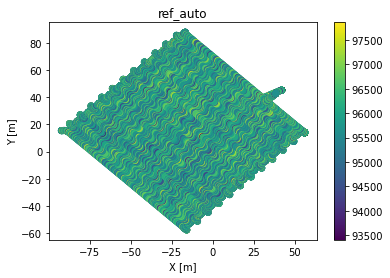

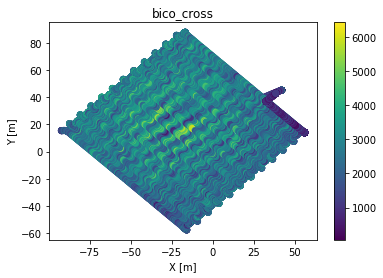

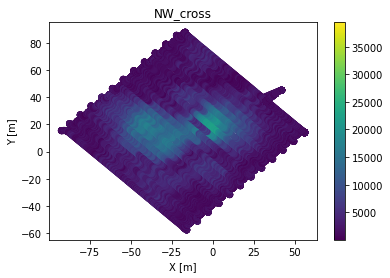

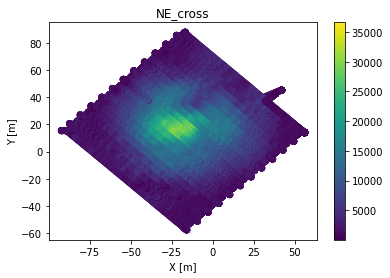

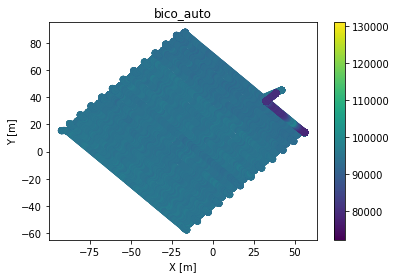

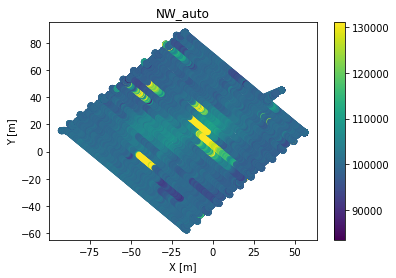

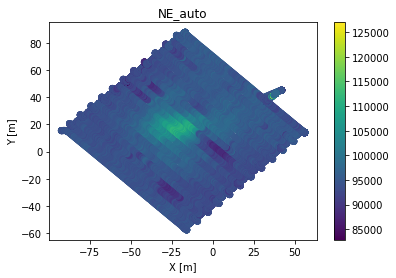

In [14]:
for j in np.arange(0,len(crmap)):
    plt.scatter(concatdata_ctc.drone_xyz_LC_interp[:,0],concatdata_ctc.drone_xyz_LC_interp[:,1],c=np.abs(concatdata_ctc.V_cross[:,f_ind,j]))
    plt.colorbar()
    plt.xlabel('X [m]')
    plt.ylabel('Y [m]')
    plt.title(chnames[j])
    plt.show()

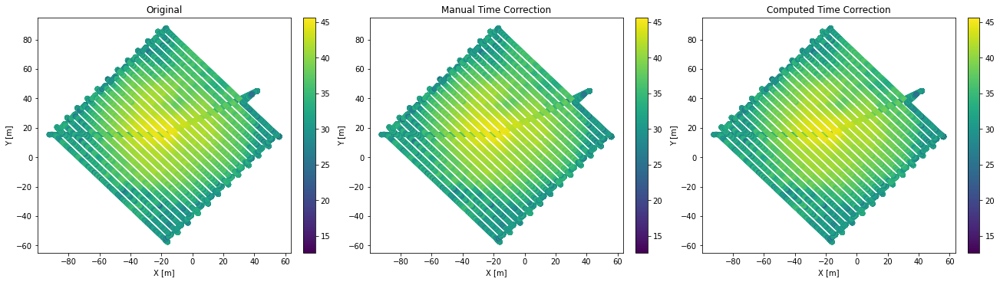

In [67]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

chan = 3

# Compute values once
c1 = 10*np.log10(np.abs(concatdata.V_cross[:, f_ind, chan]))
c2 = 10*np.log10(np.abs(concatdata_mtc.V_cross[:, f_ind, chan]))
c3 = 10*np.log10(np.abs(concatdata_ctc.V_cross[:, f_ind, chan]))

# Use a common color scale
vmin = min(np.nanmin(c1), np.nanmin(c2), np.nanmin(c3))
vmax = max(np.nanmax(c1), np.nanmax(c2), np.nanmax(c3))

# Original
sc1 = ax1.scatter(
    concatdata.drone_xyz_LC_interp[:, 0],
    concatdata.drone_xyz_LC_interp[:, 1],
    c=c1,
    vmin=vmin,
    vmax=vmax
)
ax1.set_title("Original")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
fig.colorbar(sc1, ax=ax1)

# Time Corrected
sc2 = ax2.scatter(
    concatdata_mtc.drone_xyz_LC_interp[:, 0],
    concatdata_mtc.drone_xyz_LC_interp[:, 1],
    c=c2,
    vmin=vmin,
    vmax=vmax
)
ax2.set_title("Manual Time Correction")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
fig.colorbar(sc2, ax=ax2)

# Additional Time Corrected
sc3 = ax3.scatter(
    concatdata_ctc.drone_xyz_LC_interp[:, 0],
    concatdata_ctc.drone_xyz_LC_interp[:, 1],
    c=c3,
    vmin=vmin,
    vmax=vmax
)
ax3.set_title("Computed Time Correction")
ax3.set_xlabel("X [m]")
ax3.set_ylabel("Y [m]")
fig.colorbar(sc3, ax=ax3)

plt.show()

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

chan = 2

# Compute values once
c1 = 10*np.log10(np.abs(concatdata.V_cross[:, f_ind, chan]))
c2 = 10*np.log10(np.abs(concatdata_mtc.V_cross[:, f_ind, chan]))
c3 = 10*np.log10(np.abs(concatdata_ctc.V_cross[:, f_ind, chan]))

# Use a common color scale
vmin = min(np.nanmin(c1), np.nanmin(c2), np.nanmin(c3))
vmax = max(np.nanmax(c1), np.nanmax(c2), np.nanmax(c3))

# Original
sc1 = ax1.scatter(
    concatdata.drone_xyz_LC_interp[:, 0],
    concatdata.drone_xyz_LC_interp[:, 1],
    c=c1,
    vmin=vmin,
    vmax=vmax
)
ax1.set_title("Original")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
fig.colorbar(sc1, ax=ax1)

# Time Corrected
sc2 = ax2.scatter(
    concatdata_mtc.drone_xyz_LC_interp[:, 0],
    concatdata_mtc.drone_xyz_LC_interp[:, 1],
    c=c2,
    vmin=vmin,
    vmax=vmax
)
ax2.set_title("Time Corrected")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
fig.colorbar(sc2, ax=ax2)

# Additional Time Corrected
sc3 = ax3.scatter(
    concatdata_ctc.drone_xyz_LC_interp[:, 0],
    concatdata_ctc.drone_xyz_LC_interp[:, 1],
    c=c3,
    vmin=vmin,
    vmax=vmax
)
ax3.set_title("Additional Time Corrected")
ax3.set_xlabel("X [m]")
ax3.set_ylabel("Y [m]")
fig.colorbar(sc3, ax=ax3)

plt.show()

In [6]:
# Let's pick most interesting drone data region

tlb = 2750
tub = 11550
indrange = np.arange(tlb,tub)


plt.plot(concatdata_ctc.drone_xyz_LC_interp[:,0],concatdata.drone_xyz_LC_interp[:,1],color='blue')
plt.plot(concatdata_ctc.drone_xyz_LC_interp[tlb:tub,0],concatdata_ctc.drone_xyz_LC_interp[tlb:tub,1],color='orange')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

plt.plot(concatdata_ctc.drone_xyz_LC_interp[:,0],color='blue')
plt.plot(indrange,concatdata_ctc.drone_xyz_LC_interp[tlb:tub,0],color='orange')
plt.xlabel('index')
plt.ylabel('X')
plt.show()

plt.plot(concatdata_ctc.drone_xyz_LC_interp[:,1],color='blue')
plt.plot(indrange,concatdata_ctc.drone_xyz_LC_interp[tlb:tub,1],color='orange')
plt.xlabel('index')
plt.ylabel('Y')
plt.show()

plt.plot(concatdata_ctc.drone_xyz_LC_interp[:,2],color='blue')
plt.plot(indrange,concatdata_ctc.drone_xyz_LC_interp[tlb:tub,2],color='orange')
plt.xlabel('index')
plt.ylabel('Z')
plt.show()  


plt.plot(concatdata_ctc.drone_yaw_interp,color='blue')
plt.plot(indrange,concatdata_ctc.drone_yaw_interp[tlb:tub],color='orange')
plt.xlabel('index')
plt.ylabel('Z')
plt.show()

NameError: name 'concatdata' is not defined

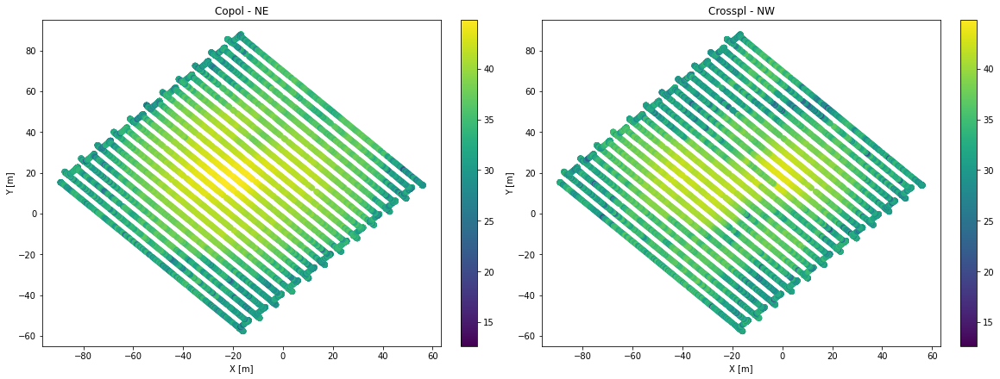

In [17]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), constrained_layout=True)



# Compute values once
c1 = 10*np.log10(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))
c2 = 10*np.log10(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 2]))

# Use a common color scale
vmin = min(np.nanmin(c1), np.nanmin(c2))
vmax = max(np.nanmax(c1), np.nanmax(c2))
# Original
sc1 = ax1.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c1,
    vmin=vmin,
    vmax=vmax
)
ax1.set_title("Copol - NE")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
fig.colorbar(sc1, ax=ax1)

# Time Corrected
sc2 = ax2.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c2,
    vmin=vmin,
    vmax=vmax
)
ax2.set_title("Crosspl - NW")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
fig.colorbar(sc2, ax=ax2)

plt.show()

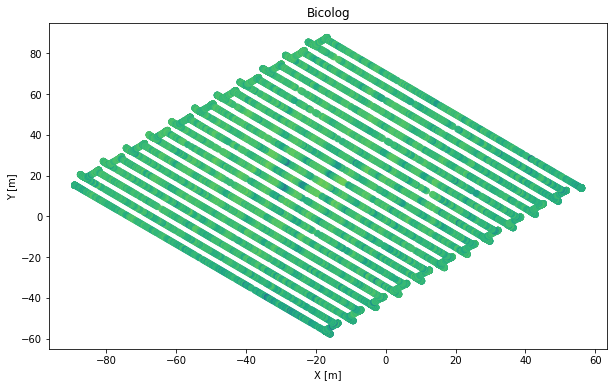

In [18]:
plt.figure(figsize=(10,6))
# Compute values once
c1 = 10*np.log10(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 1]))

sc1 = plt.scatter(
concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
c=c1,
vmin=vmin,
vmax=vmax
)
plt.title("Bicolog")
plt.xlabel("X [m]")
plt.ylabel("Y [m]")
fig.colorbar(sc1, ax=ax1)


plt.show()

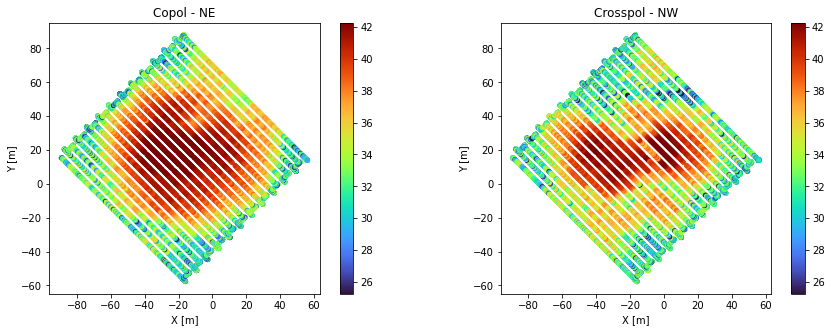

In [19]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12.5, 4.5), constrained_layout=True
)

# Compute values once
c1 = 10*np.log10(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))
c2 = 10*np.log10(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 2]))

# Stack data so both plots use the same percentile-based scaling
all_vals = np.concatenate([c1[np.isfinite(c1)], c2[np.isfinite(c2)]])

vmin = np.percentile(all_vals, 2)
vmax = np.percentile(all_vals, 98)

# Copol - NE
sc1 = ax1.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c1,
    cmap="turbo",
    vmin=vmin,
    vmax=vmax,
    s=18
)

ax1.set_title("Copol - NE")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
fig.colorbar(sc1, ax=ax1)

# Crosspol - NW
sc2 = ax2.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c2,
    cmap="turbo",
    vmin=vmin,
    vmax=vmax,
    s=18
)

ax2.set_title("Crosspol - NW")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
ax2.set_aspect("equal")
fig.colorbar(sc2, ax=ax2)
fig.savefig("NWgNEp_cop_cross_maps.png", dpi=300, bbox_inches="tight")
plt.show()

In [23]:
def unwrap(phase_data):
    # Convert phase data to radians and unwrap
    unwrapped_data = np.unwrap(np.radians(phase_data))
    
    # Convert back to degrees
    unwrapped_data = np.degrees(unwrapped_data)
    
    # Align unwrapped data with the first point of the wrapped data
    adjustment = phase_data[-1] - unwrapped_data[-1]
    unwrapped_data += adjustment
    
    return unwrapped_data

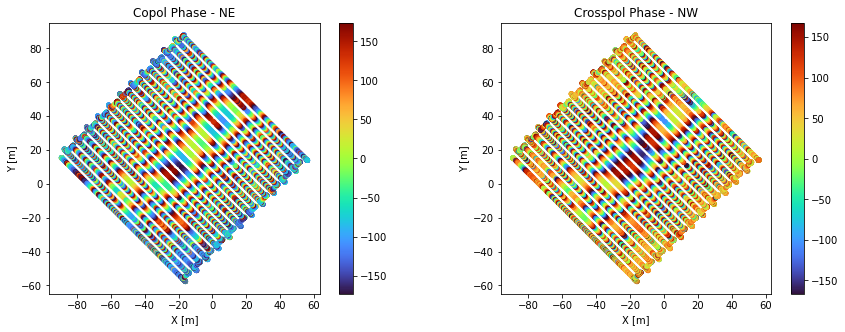

In [53]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12.5, 4.5), constrained_layout=True
)

# Compute values once

c1 = np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))
c2 = np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb:tub, f_ind, 2]))

# Independent percentile-based color scaling
vmin1, vmax1 = np.percentile(c1[np.isfinite(c1)], [2, 98])
vmin2, vmax2 = np.percentile(c2[np.isfinite(c2)], [2, 98])

# Copol - NE
sc1 = ax1.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c1,
    cmap="turbo",
    vmin=vmin1,
    vmax=vmax1,
    s=18
)

ax1.set_title("Copol Phase - NE")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
fig.colorbar(sc1, ax=ax1)

# Crosspol - NW
sc2 = ax2.scatter(
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[tlb:tub, 1],
    c=c2,
    cmap="turbo",
    vmin=vmin2,
    vmax=vmax2,
    s=18
)

ax2.set_title("Crosspol Phase - NW")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
ax2.set_aspect("equal")
fig.colorbar(sc2, ax=ax2)

plt.show()

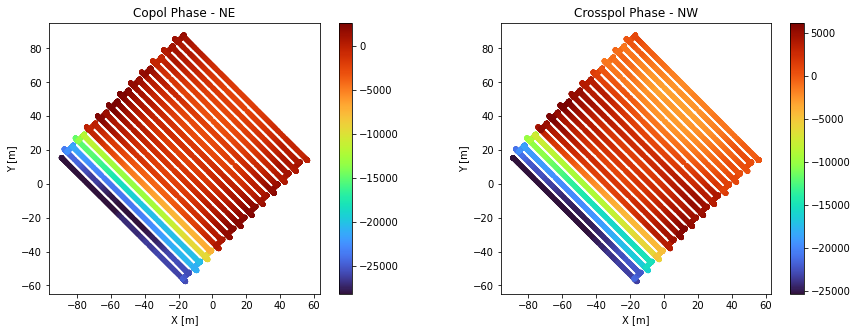

In [71]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12.5, 4.5), constrained_layout=True
)

ntlb = tlb
#ntlb = tlb+2750

# Compute values once

c1 = unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 3])))
c2 = unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 2])))

# Independent percentile-based color scaling
vmin1, vmax1 = np.percentile(c1[np.isfinite(c1)], [2, 98])
vmin2, vmax2 = np.percentile(c2[np.isfinite(c2)], [2, 98])

# Copol - NE
sc1 = ax1.scatter(
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 1],
    c=c1,
    cmap="turbo",
    vmin=vmin1,
    vmax=vmax1,
    s=18
)

ax1.set_title("Copol Phase - NE")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
fig.colorbar(sc1, ax=ax1)

# Crosspol - NW
sc2 = ax2.scatter(
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 1],
    c=c2,
    cmap="turbo",
    vmin=vmin2,
    vmax=vmax2,
    s=18
)

ax2.set_title("Crosspol Phase - NW")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
ax2.set_aspect("equal")
fig.colorbar(sc2, ax=ax2)

plt.show()

8800


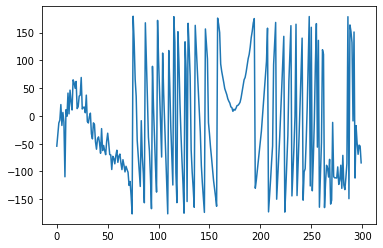

In [43]:
print(tub-tlb)
plt.plot(np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb+5000:tub-3500, f_ind, 3])))

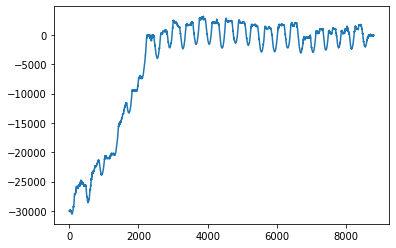

In [45]:
plt.plot(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))))

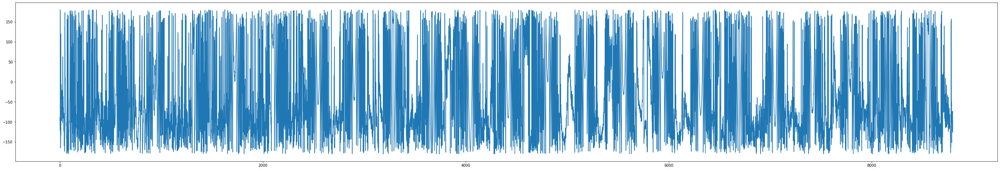

In [54]:
plt.figure(figsize=(48,8))
plt.plot((np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))))

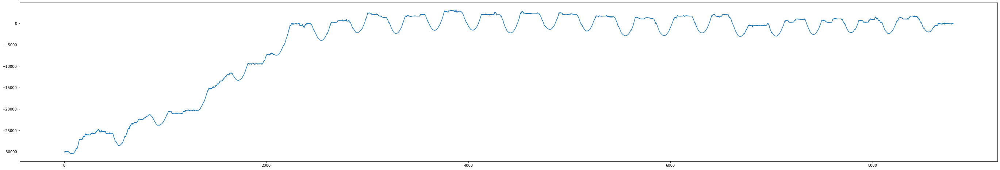

In [55]:
plt.figure(figsize=(48,8))
plt.plot(unwrap((np.rad2deg(np.angle(concatdata_ctc.V_cross[tlb:tub, f_ind, 3])))))

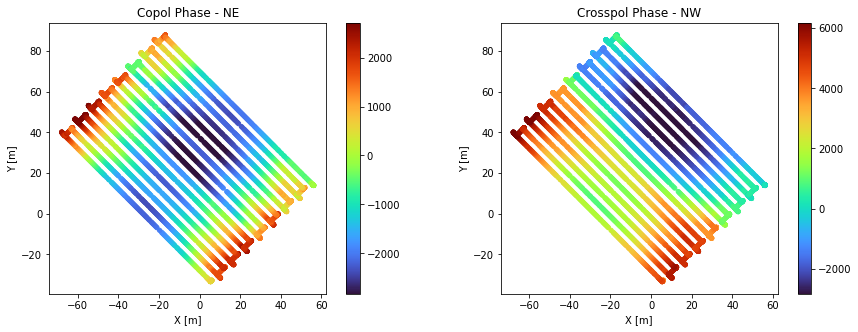

In [72]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12.5, 4.5), constrained_layout=True
)

ntlb = tlb+2750

# Compute values once

c1 = unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 3])))
c2 = unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 2])))

# Independent percentile-based color scaling
vmin1, vmax1 = np.percentile(c1[np.isfinite(c1)], [2, 98])
vmin2, vmax2 = np.percentile(c2[np.isfinite(c2)], [2, 98])

# Copol - NE
sc1 = ax1.scatter(
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 1],
    c=c1,
    cmap="turbo",
    vmin=vmin1,
    vmax=vmax1,
    s=18
)

ax1.set_title("Copol Phase - NE")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
fig.colorbar(sc1, ax=ax1)

# Crosspol - NW
sc2 = ax2.scatter(
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 0],
    concatdata_ctc.drone_xyz_LC_interp[ntlb:tub, 1],
    c=c2,
    cmap="turbo",
    vmin=vmin2,
    vmax=vmax2,
    s=18
)

ax2.set_title("Crosspol Phase - NW")
ax2.set_xlabel("X [m]")
ax2.set_ylabel("Y [m]")
ax2.set_aspect("equal")
fig.colorbar(sc2, ax=ax2)

plt.show()

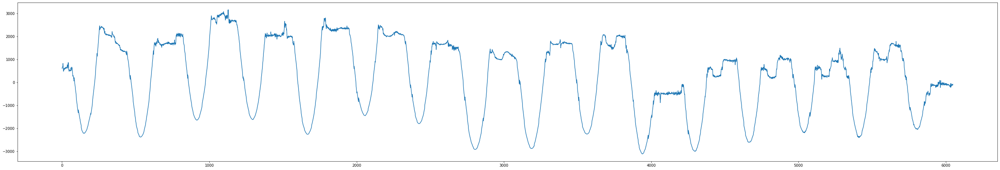

In [63]:
plt.figure(figsize=(48,8))
plt.plot(unwrap((np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 3])))))

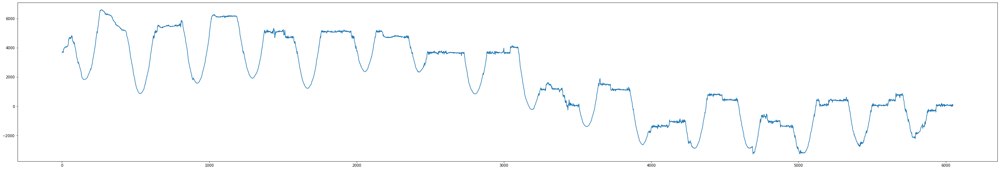

In [64]:
plt.figure(figsize=(48,8))
plt.plot(unwrap((np.rad2deg(np.angle(concatdata_ctc.V_cross[ntlb:tub, f_ind, 2])))))

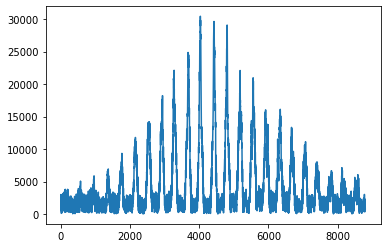

In [74]:
plt.plot(np.abs(concatdata_ctc.V_cross[tlb:tub, f_ind, 3]))

[123]


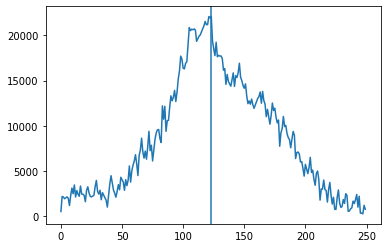

In [90]:
plt.plot(np.abs(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))
plt.axvline(
    np.where(np.abs(concatdata_ctc.V_cross[5900:6150, f_ind, 3]) == 
             np.max(np.abs(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))))

print(np.where(np.abs(concatdata_ctc.V_cross[5900:6150, f_ind, 3]) == 
             np.max(np.abs(concatdata_ctc.V_cross[5900:6150, f_ind, 3])))[0])

[134]


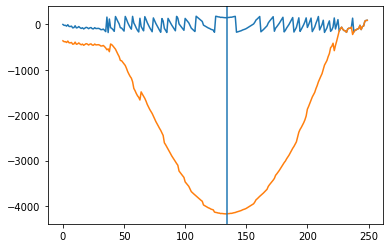

In [91]:
plt.plot(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3])))
plt.plot(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))))

plt.axvline(np.where(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))) == 
                     np.min(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))))))

print(np.where(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3]))) == 
                     np.min(unwrap(np.rad2deg(np.angle(concatdata_ctc.V_cross[5900:6150, f_ind, 3])))))[0])

Initializing CONCAT CLASS with active traceback using:
  --> /hirax/DNS_freespace/2026_07_GBO/TONE_crs_files/drone_flight7_NWgrid_NEpol_42db_jul2_1900/
  --> Jul-2nd-2026-07-08PM-Flight-Airdata.csv
Creating directory for saving traceback and analysis outputs:
  --> /hirax/DNS_freespace/2026_07_GBO/analysis_outputs/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T174319/
Concat initialized without previous config file...
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 8800 elements
  --> drone timestamp axis contains 12253 elements
Synchronizing data from correlator and drone:
  --> chans value 3 = Cross 0x3 (fit via np.abs()).
  --> Previous t_delta_dji not found
  --> Calculating via 2DGauss fitting routine:
  --> Applying known t_drone_offset = -243.306s before searching for t_delta_dji


Coarse search:   0%|          | 0/100 [00:00<?, ?it/s]

Fine search:   0%|          | 0/40 [00:00<?, ?it/s]

Applying a time correction of -0.00 seconds using Cross 0x3 fits.
  --> apply_t_delta_dji=False: t_delta_dji = -0.000s found/loaded but NOT applied. This object's drone coordinates still only reflect t_drone_offset = -243.306s. Re-run with apply_t_delta_dji=True to apply it (this will not repeat the search, since t_delta_dji is already cached).
  --> Fitting main beam at t_delta_dji=-0.000s for evaluation/later use (e.g. FWHM vs frequency):
  --> Saved main beam fit parameters: /hirax/DNS_freespace/2026_07_GBO/analysis_outputs/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T174319/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T174319_Synchronization_MainBeam_Fits.npz
  --> Generating output verification plots (always evaluated at t_delta_dji, regardless of apply_t_delta_dji):
  --> Saving output plot.


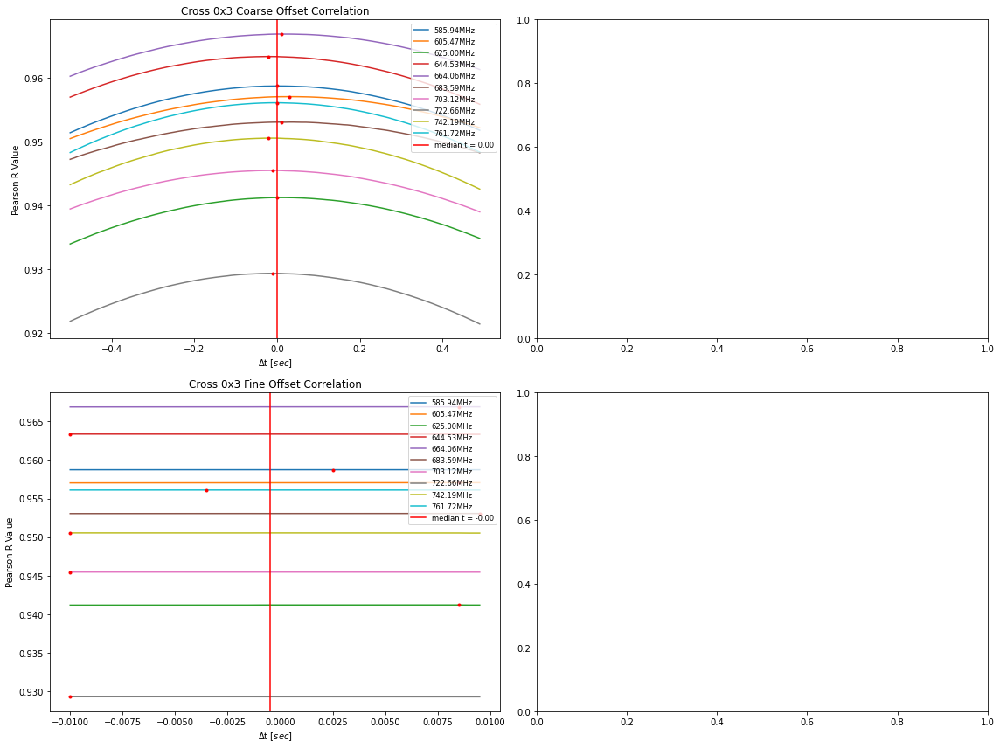

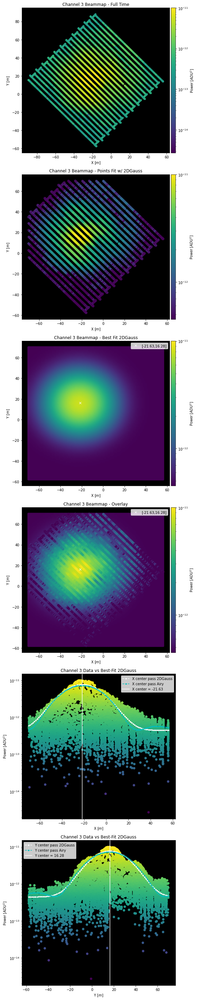

In [13]:
tlb = 2750
tub = 11550

concatdataa=concat.CONCAT(
    CORRDATCLASS=corrdata,
    DRONEDATCLASS=dronedata,
    load_yaml=False,
    save_traceback=True,
    output_directory=maindir+'analysis_outputs/',
    t_drone_offset=-243.676+0.37,
    t_bounds=[tlb, tub]
)


concatdataa.Synchronization_Function(
    inputcorr=corrdata,
    inputdrone=dronedata,

    # Residual search around the applied correction
    coarse_params=[-0.5, 0.5, .01],
    fine_params=[-0.01, 0.01, 0.0005],

    FMB_coordbounds=[70.0, 70.0, 180.0],
    freqs=np.arange(3000,4000,100),
    FMB_ampbound=.999,
    chans=np.array([copolchan])
)

In [7]:
tlb = 2750
tub = 11550

concatdata_ctc = concat.CONCAT(
    CORRDATCLASS=corrdata,
    DRONEDATCLASS=dronedata,
    load_yaml=False,
    save_traceback=True,
    output_directory=maindir+'analysis_outputs/',
    t_drone_offset=-243.306,
    t_bounds=[tlb, tub]
)

Initializing CONCAT CLASS with active traceback using:
  --> /hirax/DNS_freespace/2026_07_GBO/TONE_crs_files/drone_flight7_NWgrid_NEpol_42db_jul2_1900/
  --> Jul-2nd-2026-07-08PM-Flight-Airdata.csv
Creating directory for saving traceback and analysis outputs:
  --> /hirax/DNS_freespace/2026_07_GBO/analysis_outputs/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260830T040744/
Concat initialized without previous config file...
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 8800 elements
  --> drone timestamp axis contains 12253 elements


Initializing CONCAT CLASS with active traceback using:
  --> /hirax/DNS_freespace/2026_07_GBO/TONE_crs_files/drone_flight7_NWgrid_NEpol_42db_jul2_1900/
  --> Jul-2nd-2026-07-08PM-Flight-Airdata.csv
Creating directory for saving traceback and analysis outputs:
  --> /hirax/DNS_freespace/2026_07_GBO/analysis_outputs/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T175632/
Concat initialized without previous config file...
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 8800 elements
  --> drone timestamp axis contains 12253 elements
Synchronizing data from correlator and drone:
  --> chans value 3 = Cross 0x3 (fit via np.abs()).
  --> Previous t_delta_dji not found
  --> Calculating via 2DGauss fitting routine:
  --> Applying known t_drone_offset = -243.306s before searching for t_delta_dji


Coarse search:   0%|          | 0/4 [00:00<?, ?it/s]

/home/mlc253/anaconda3/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Fine search:   0%|          | 0/10 [00:00<?, ?it/s]

/home/mlc253/anaconda3/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4461: NearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(stats.NearConstantInputWarning(msg))


Applying a time correction of -0.00 seconds using Cross 0x3 fits.


../../classes/concat_crs_mod_draft.py:689: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  tight_layout()


  --> apply_t_delta_dji=False: t_delta_dji = -0.000s found/loaded but NOT applied. This object's drone coordinates still only reflect t_drone_offset = -243.306s. Re-run with apply_t_delta_dji=True to apply it (this will not repeat the search, since t_delta_dji is already cached).
  --> Fitting main beam at t_delta_dji=-0.000s for evaluation/later use (e.g. FWHM vs frequency):
  --> Saved main beam fit parameters: /hirax/DNS_freespace/2026_07_GBO/analysis_outputs/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T175632/Jul-2nd-2026-07-08PM-Flight-Airdata_drone_flight7_NWgrid_NEpol_42db_jul2_1900_ver_20260828T175632_Synchronization_MainBeam_Fits.npz
  --> Generating output verification plots (always evaluated at t_delta_dji, regardless of apply_t_delta_dji):
  --> Saving output plot.


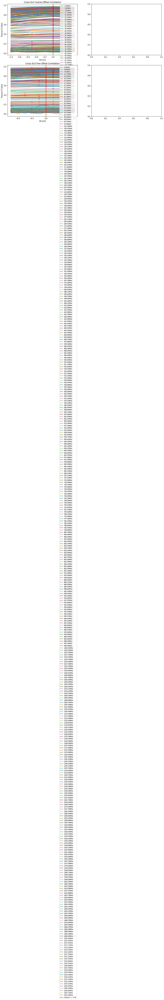

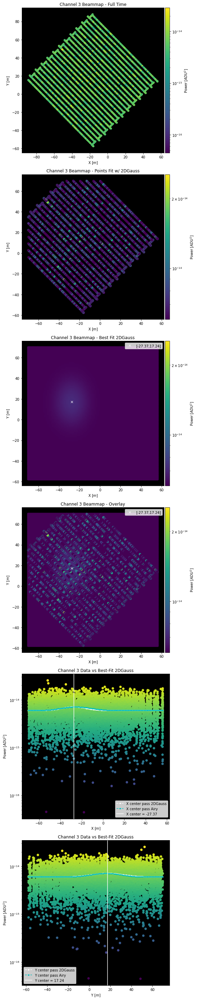

In [15]:
concatdata_ctc = concat.CONCAT(
    CORRDATCLASS=corrdata,
    DRONEDATCLASS=dronedata,
    load_yaml=False,
    save_traceback=True,
    output_directory=maindir+'analysis_outputs/',
    t_drone_offset=-243.306,
    t_bounds=[tlb, tub]
)

concatdata_ctc.Synchronization_Function(
    inputcorr=corrdata,
    inputdrone=dronedata,

    # Residual search around the applied correction
    coarse_params=[-1.0, 1.0, 0.5],
    fine_params=[-0.5, 0.5, 0.1],

    FMB_coordbounds=[70.0, 70.0, 180.0],
    freqs=np.arange(0,8192,20),#(3100,6500,10),
    FMB_ampbound=.999,
    chans=np.array([copolchan])
)

Fitted peak amplitude A0 = 5.838e-12
Beam center: (-18.60, 17.47) m
1/e widths: sigma_x=23.01 m, sigma_y=19.38 m


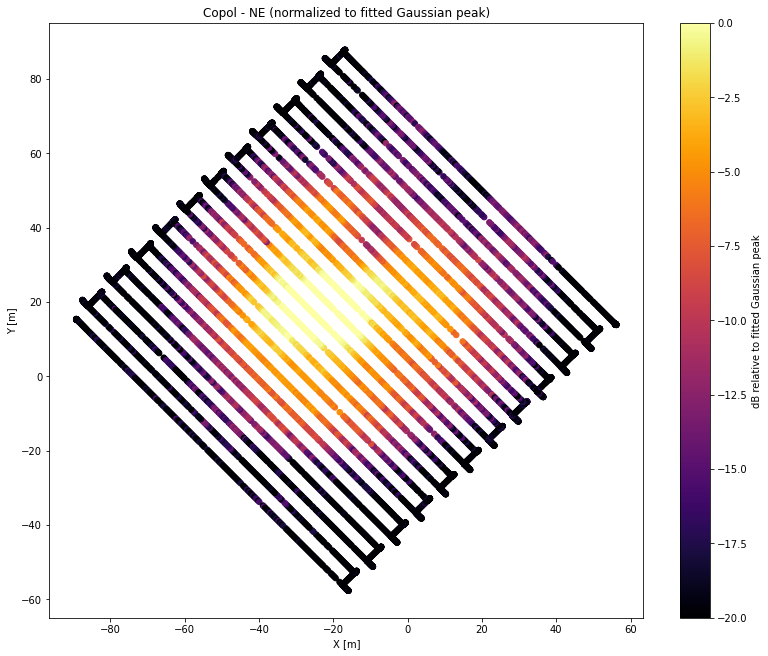

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Data ---
V = concatdata_ctc.V[:, f_ind, 3]
x = concatdata_ctc.drone_xyz_LC_interp[:, 0]
y = concatdata_ctc.drone_xyz_LC_interp[:, 1]

amp = np.abs(V)
good = np.isfinite(amp) & np.isfinite(x) & np.isfinite(y)
amp, x, y = amp[good], x[good], y[good]

# --- 2D Gaussian model, fit on linear amplitude (not dB) ---
def gauss2d(coords, A0, x0, y0, sigma_x, sigma_y, offset):
    xx, yy = coords
    return offset + A0 * np.exp(
        -(((xx - x0) ** 2) / (2 * sigma_x ** 2) + ((yy - y0) ** 2) / (2 * sigma_y ** 2))
    )

# Initial guesses pulled straight from the data
i_peak = np.argmax(amp)
p0 = [
    amp[i_peak],               # A0: peak amplitude
    x[i_peak], y[i_peak],      # beam center
    (x.max() - x.min()) / 6,   # sigma_x guess
    (y.max() - y.min()) / 6,   # sigma_y guess
    np.percentile(amp, 5),     # noise-floor offset guess
]

popt, _ = curve_fit(gauss2d, (x, y), amp, p0=p0, maxfev=20000)
A0_fit, x0_fit, y0_fit, sigx_fit, sigy_fit, offset_fit = popt

print(f"Fitted peak amplitude A0 = {A0_fit:.4g}")
print(f"Beam center: ({x0_fit:.2f}, {y0_fit:.2f}) m")
print(f"1/e widths: sigma_x={sigx_fit:.2f} m, sigma_y={sigy_fit:.2f} m")

# --- Normalize to the fitted Gaussian peak, in dB ---
c1 = 20 * np.log10(amp / A0_fit)   # 0 dB = fitted main-beam peak

# --- Explicit, fixed color scale so sidelobe level reads directly ---
vmin, vmax = -20, 0   # pick the dynamic range you care about seeing

fig, ax1 = plt.subplots(figsize=(12, 9), constrained_layout=True)
sc1 = ax1.scatter(x, y, c=c1, cmap="inferno", vmin=vmin, vmax=vmax, s=30)
ax1.set_title("Copol - NE (normalized to fitted Gaussian peak)")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
cbar = fig.colorbar(sc1, ax=ax1)
cbar.set_label("dB relative to fitted Gaussian peak")
fig.savefig("NEp_cop_map.png", dpi=300, bbox_inches="tight")
plt.show()

Fitted peak amplitude A0 = 5.838e-12
Beam center: (-18.60, 17.47) m
1/e widths: sigma_x=23.01 m, sigma_y=19.38 m
c1 percentiles [1,5,25,50,75,95,99]: [-39.72095135 -32.56760647 -24.71882474 -20.23641232 -12.85824426
  -3.56012342   0.70592909]


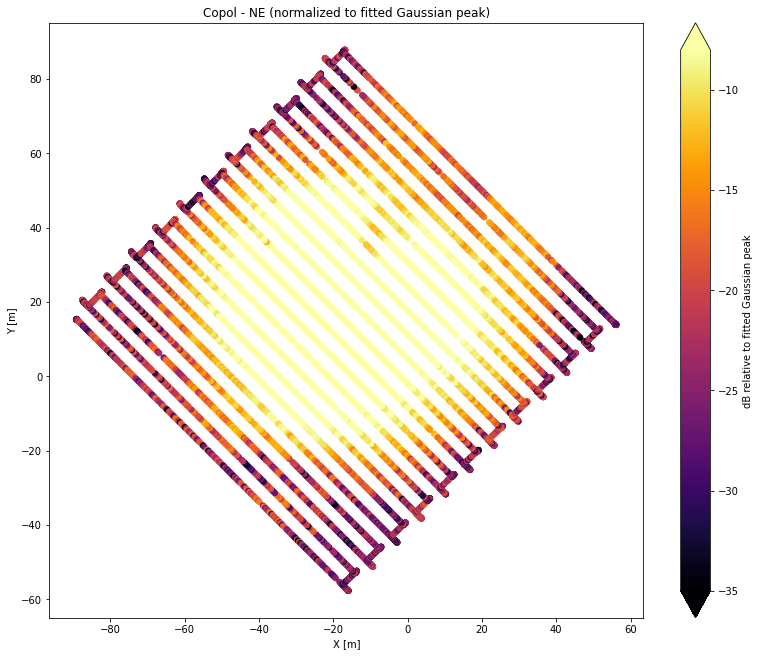

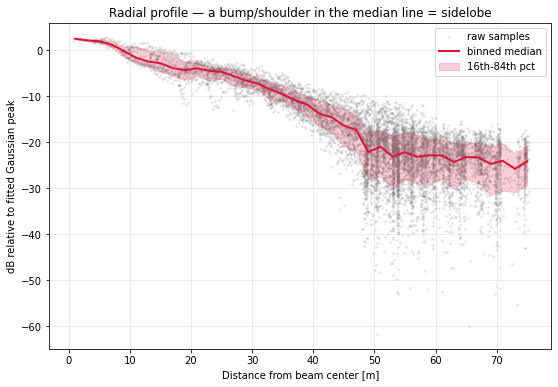

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- Data ---
V = concatdata_ctc.V[:, f_ind, 3]
x = concatdata_ctc.drone_xyz_LC_interp[:, 0]
y = concatdata_ctc.drone_xyz_LC_interp[:, 1]

amp = np.abs(V)
good = np.isfinite(amp) & np.isfinite(x) & np.isfinite(y)
amp, x, y = amp[good], x[good], y[good]

# --- 2D Gaussian fit (linear amplitude) ---
def gauss2d(coords, A0, x0, y0, sigma_x, sigma_y, offset):
    xx, yy = coords
    return offset + A0 * np.exp(
        -(((xx - x0) ** 2) / (2 * sigma_x ** 2) + ((yy - y0) ** 2) / (2 * sigma_y ** 2))
    )

i_peak = np.argmax(amp)
p0 = [
    amp[i_peak], x[i_peak], y[i_peak],
    (x.max() - x.min()) / 6, (y.max() - y.min()) / 6,
    np.percentile(amp, 5),
]
popt, _ = curve_fit(gauss2d, (x, y), amp, p0=p0, maxfev=20000)
A0_fit, x0_fit, y0_fit, sigx_fit, sigy_fit, offset_fit = popt

print(f"Fitted peak amplitude A0 = {A0_fit:.4g}")
print(f"Beam center: ({x0_fit:.2f}, {y0_fit:.2f}) m")
print(f"1/e widths: sigma_x={sigx_fit:.2f} m, sigma_y={sigy_fit:.2f} m")

# --- Normalize to fitted peak, in dB ---
c1 = 20 * np.log10(amp / A0_fit)
print("c1 percentiles [1,5,25,50,75,95,99]:", np.percentile(c1, [1, 5, 25, 50, 75, 95, 99]))

# --- 2D map (tune vmin/vmax from the percentiles printed above) ---
vmin, vmax = -35, -8

fig, ax1 = plt.subplots(figsize=(12, 9), constrained_layout=True)
sc1 = ax1.scatter(x, y, c=c1, cmap="inferno", vmin=vmin, vmax=vmax, s=30)
ax1.set_title("Copol - NE (normalized to fitted Gaussian peak)")
ax1.set_xlabel("X [m]")
ax1.set_ylabel("Y [m]")
ax1.set_aspect("equal")
cbar = fig.colorbar(sc1, ax=ax1, extend="both")
cbar.set_label("dB relative to fitted Gaussian peak")
fig.savefig("NEp_cop_map.png", dpi=300, bbox_inches="tight")
plt.show()

# --- Radial profile: the real diagnostic for sidelobe level ---
r = np.sqrt((x - x0_fit) ** 2 + (y - y0_fit) ** 2)

bin_width = 2.0  # meters; shrink/grow depending on how fine your scan is
bin_edges = np.arange(0, r.max() + bin_width, bin_width)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
bin_idx = np.digitize(r, bin_edges)

median_dB = np.full(len(bin_centers), np.nan)
p16 = np.full(len(bin_centers), np.nan)
p84 = np.full(len(bin_centers), np.nan)
for i in range(1, len(bin_edges)):
    mask = bin_idx == i
    if mask.sum() > 0:
        median_dB[i - 1] = np.median(c1[mask])
        p16[i - 1] = np.percentile(c1[mask], 16)
        p84[i - 1] = np.percentile(c1[mask], 84)

plt.figure(figsize=(9, 6))
plt.scatter(r, c1, s=3, alpha=0.15, color="gray", label="raw samples")
plt.plot(bin_centers, median_dB, color="crimson", lw=2, label="binned median")
plt.fill_between(bin_centers, p16, p84, color="crimson", alpha=0.2, label="16th-84th pct")
plt.xlabel("Distance from beam center [m]")
plt.ylabel("dB relative to fitted Gaussian peak")
plt.title("Radial profile — a bump/shoulder in the median line = sidelobe")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("NEp_cop_radial_profile.png", dpi=300, bbox_inches="tight")
plt.show()